# 3. Expolartory Data Analysis

In [1]:
%load_ext autoreload
%autoreload 2

naming convetion

NOD : No Outlier Detection

OD : Outlier Detection

LN : linear interpolation

IDW : Inverse Distance Weight interpolation

ra : rating best code A

rab : rating good code A +B

In [2]:
import os, sys, pickle
from pathlib import Path

#dir_path = os.path.dirname(os.path.abspath(os.curdir))
#os.chdir(dir_path)

from agrid.grid import Grid


import pandas as pd

import re
import copy

import numpy as np
from numpy import asarray
from numpy import save
from numpy import load

from scipy import stats, interpolate, spatial, io
from scipy.ndimage import gaussian_filter, median_filter
import xarray as xr
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors
import matplotlib as mpl
from matplotlib.patches import Arc 
import cartopy.crs as ccrs

import pyproj as proj
import rasterio


from sklearn import linear_model
from sklearn.metrics import r2_score, mean_squared_error

import seaborn as sns

from joblib import Parallel, delayed
import multiprocessing
import numba as nb
from numba import jit

import warnings
warnings.filterwarnings('ignore')


import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns; sns.set()

sns.set_theme(style="white")

# evaluate model performance with outliers removed using isolation forest
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_absolute_error
# load the dataset


from sklearn.metrics import make_scorer , r2_score, explained_variance_score
from sklearn.pipeline import Pipeline
from skopt import BayesSearchCV
from sklearn.model_selection import KFold, StratifiedKFold
from skopt.space import Real, Categorical, Integer

from scipy import stats
from collections import OrderedDict

from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

from sklearn.preprocessing import PowerTransformer
from sklearn.compose import TransformedTargetRegressor

from sklearn.compose import ColumnTransformer

from sklearn.compose import make_column_selector as selector


In [3]:
# constanst

#parent directory

dir_p = Path().resolve() 

#constants
km = 1000
milli = 0.001
micro = 0.000001

# fig size for presentation
fig_pres_small = (4,3)

fig_pres_small_cbar = (4,2)
#aspect ratio
fig_pres_large = (16,9)



# We can exclude Arctic ocean and Antarctica, as there are no HF measurements to use
world_lon_min, world_lon_max, world_lat_min, world_lat_max  = -180, 180, -60, 80

# map extents of Africa and Australia
afr_lon_min, afr_lon_max, afr_lat_min, afr_lat_max =  -20, 52, -37 , 36  


# create grid for each region
# crs Coordinate reference system

#EPSG is projection
# 0.2 degrees equal roughly 20 km

World = Grid(res=[0.2, 0.2], up=world_lat_max, down=world_lat_min)

# africa grid

Africa =    Grid(res=[0.2, 0.2],  left = afr_lon_min, right= afr_lon_max, up=afr_lat_max , down=afr_lat_min)

# africa grid low resolution 50 x 50 km

Africa_50 =    Grid(res=[0.5, 0.5],  left = afr_lon_min, right= afr_lon_max, up=afr_lat_max , down=afr_lat_min)


#dictionary of all grids

grids = {}

grids['Afr'] = Africa
grids['Afr_50'] = Africa_50
grids['World'] = World


In [4]:
# to ease looping with dictionaries

regions_a_a5 = [ 'Afr','Afr_50' ]

regions_w_a = [ 'World' ,'Afr',]
regions_w_aus = [ 'World' ,'Aus',]


regions_w_a_a5 = [ 'World' ,'Afr', 'Afr_50']


regions_Total = ['World' ,'Afr', 'Afr_50',]


# raster exenets to adjust map
raster_extent_Afr = [grids['Afr'].extent[0], grids['Afr'].extent[1], grids['Afr'].extent[3], grids['Afr'].extent[2]]
raster_extent_Afr_50 = [grids['Afr_50'].extent[0], grids['Afr_50'].extent[1], grids['Afr_50'].extent[3], grids['Afr_50'].extent[2]]
raster_extent_World = [grids['World'].extent[0], grids['World'].extent[1], grids['World'].extent[3], grids['World'].extent[2]]

# to correct plot maps
raster_extents = {}

raster_extents['Afr'] = raster_extent_Afr
raster_extents['Afr_50'] = raster_extent_Afr_50
raster_extents['World'] = raster_extent_World


# list of latitudes and longitudes
lon_dict = {}
lat_dict = {}

lon_dict['Afr'] = [afr_lon_min, afr_lon_max]
lon_dict['Afr_50'] = [afr_lon_min, afr_lon_max]
lon_dict['World'] = [world_lon_min, world_lon_max]

lat_dict['Afr'] = [afr_lat_min, afr_lat_max]
lat_dict['Afr_50'] = [afr_lat_min, afr_lat_max]
lat_dict['World'] = [world_lat_min, world_lat_max]


print('terminated')

terminated


In [5]:
obs = pd.DataFrame()


''' 
obs['REF_n'] = [ 'MOHO','LAB', 'RHO_C', 'SV', 'PV', 'CTD',
             'RHO_L', 'DEM', 
                'VOLC_DIST_W', 'A_MEDIAN_W', 'FA', 'SI','LITH_MANTLE', 
                'EMAG2_CLASS', 'GEOID', 'BG',
              'GLIM']'''



obs['OBS_REF_IDW'] = ['CTD_IDW' ,  'SI_IDW',"LAB_IDW", "MOHO_IDW",
            "SV_IDW","PV_IDW", 
            'GEOID_IDW','FA_IDW','DEM','BG_IDW', 'EMAG2_CLASS',
                   'RHO_L_IDW', 'RHO_C_IDW', 
                  'VOLC_DIST_W', 'REG', 'GLIM']



obs['OBS_REF_LN'] = ['CTD_LN' ,  'SI_LN',"LAB_LN", "MOHO_LN",
            "SV_LN","PV_LN", 
            'GEOID_LN','FA_LN','DEM','BG_LN', 'EMAG2_CLASS',
                  'RHO_L_LN', 'RHO_C_LN', 
                      'VOLC_DIST_W', 'REG', 'GLIM']
  
     
# Labels for plots etc
obs['LABELS'] = ['CTD',  'Shape index', 'LAB depth', 'Moho depth', 
                'S$_V$ 150km', 'P$_V$ 150km', 
                'Geoid', 'Free air', 'DEM', 'Bouguer', 'Mag.', 
                'Lith. ρ', 'Crust ρ',  
                 'Volcano d.', 'GliM', 'REG', ]  
    
    
# 'vp/vs'
# Units to display in plots etc
obs['UNITS'] = ['km',  'si', 'km', 'km',
             '$\delta$ v_s %','$\delta$ v_p %', 
             'm', 'mGal', 'm', 'mGal',  'f(nT)', 
                 'kg/m$^3$', 'kg/m$^3$',
                'km',  'class', 'class']
        
# Range of colormap for plots. Similar data are placed in same ranges for consistancy
obs['V_RANGE'] = [(0,50), (-1,1),(0,300),(15,60),
              (-0.075,0.075), (-0.02,0.02), 
              (-45,45), (-100,100) , (-2200, 2200),(-100,100),  (-0.4, 0.4), 
                   (3260, 3360), (2650, 2950),
                  (0,1), (1,6),(1,15),]
    



#new_index = [4,3,15,6,7,0,14,10,16,17,9, 2,1,5,13,12, 8,11,]

#new_index = [4,3,15,6,7,0, 14, 10,16, 8, 9,2, 13, 12, 8, 11, ]

#obs = obs.reindex(new_index)

obs.index = np.arange(0,len(obs))

pd.options.display.width = 370
pd.options.display.max_colwidth = 12
print(obs)

n_obs = len(obs)

obs_dict = obs.to_dict(orient='records')



    OBS_REF_IDW   OBS_REF_LN       LABELS        UNITS      V_RANGE
0       CTD_IDW       CTD_LN          CTD           km      (0, 50)
1        SI_IDW        SI_LN  Shape index           si      (-1, 1)
2       LAB_IDW       LAB_LN    LAB depth           km     (0, 300)
3      MOHO_IDW      MOHO_LN   Moho depth           km     (15, 60)
4        SV_IDW        SV_LN  S$_V$ 150km  $\delta$...  (-0.075,...
5        PV_IDW        PV_LN  P$_V$ 150km  $\delta$...  (-0.02, ...
6     GEOID_IDW     GEOID_LN        Geoid            m    (-45, 45)
7        FA_IDW        FA_LN     Free air         mGal  (-100, 100)
8           DEM          DEM          DEM            m  (-2200, ...
9        BG_IDW        BG_LN      Bouguer         mGal  (-100, 100)
10  EMAG2_CLASS  EMAG2_CLASS         Mag.        f(nT)  (-0.4, 0.4)
11    RHO_L_IDW     RHO_L_LN      Lith. ρ     kg/m$^3$  (3260, 3...
12    RHO_C_IDW     RHO_C_LN      Crust ρ     kg/m$^3$  (2650, 2...
13  VOLC_DIST_W  VOLC_DIST_W   Volcano d.       

In [6]:
# helper function for plotting

class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if isinstance(self.sg, sns.axisgrid.FacetGrid) or \
            isinstance(self.sg, sns.axisgrid.PairGrid):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(n,m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i,j], self.subgrid[i,j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h= self.sg.ax_joint.get_position().height
        h2= self.sg.ax_marg_x.get_position().height
        r = int(np.round(h/h2))
        self._resize()
        self.subgrid = gridspec.GridSpecFromSubplotSpec(r+1,r+1, subplot_spec=self.subplot)

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        #https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure=self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())

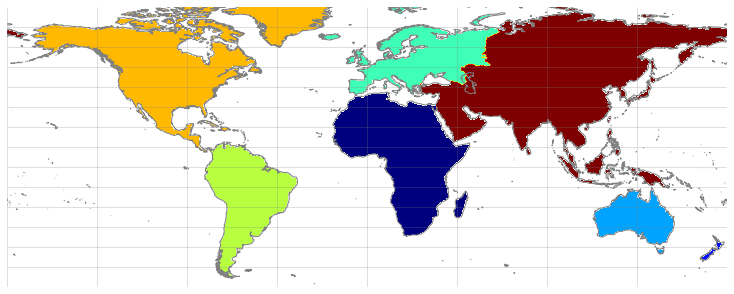

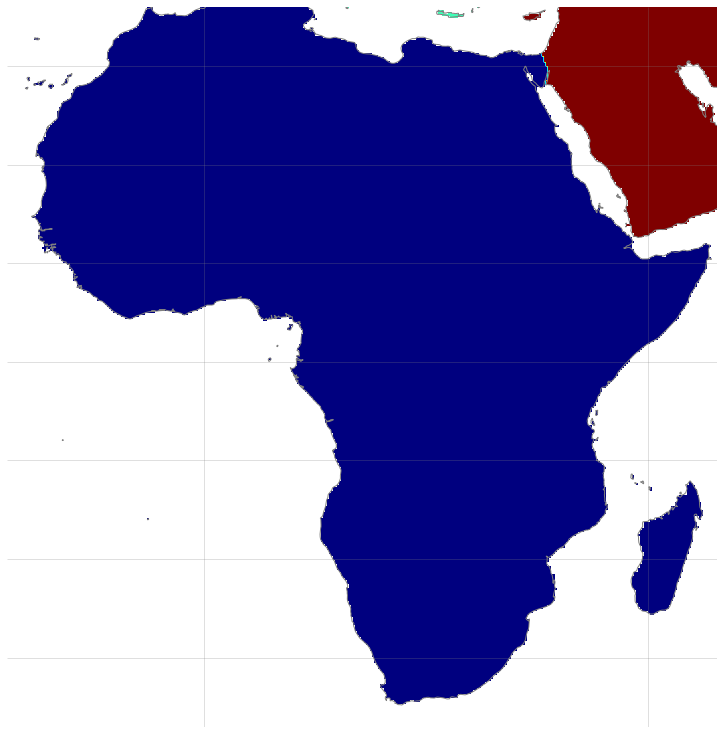

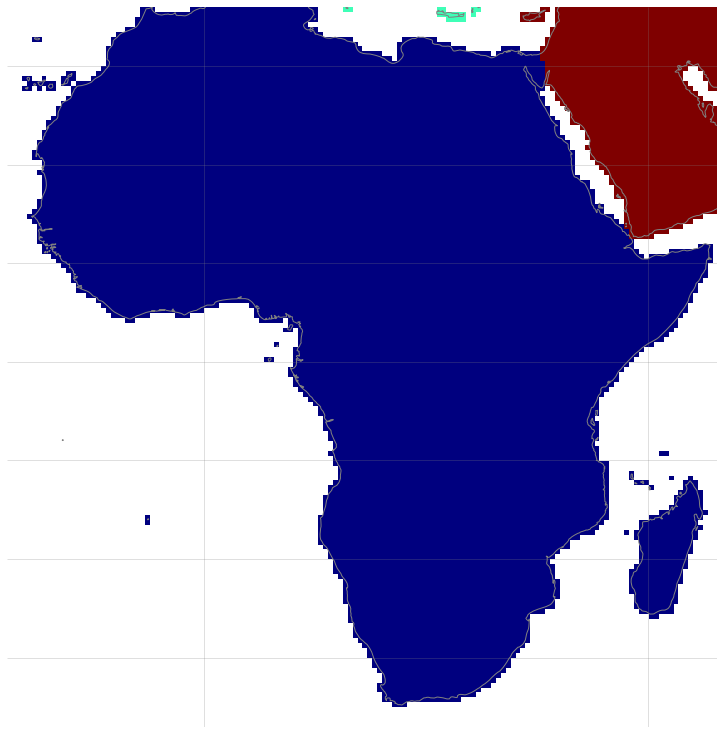

In [7]:
#https://github.com/nvkelso/natural-earth-vector
# natural earth 10 m land shape
ne_10m_land = dir_p / 'data'/ 'Shapefiles'/'NE'/ 'ne_10m_land.shp'
continents = dir_p /'data'/ 'Shapefiles'/'continents'/ 'continent.shp'

# LAND is water vs land
#Continet describes each continent

#assign_shape Rasterize vector polygons to grid 

for region in regions_Total:
    # Use continental plates instead
    grids[region].ds['LAND'] = (('Y', 'X'), grids[region].assign_shape(ne_10m_land, 
                                               'scalerank', map_to_int = False, burn_val = 1))


    grids[region].ds['CONTINENT'] = (('Y', 'X'), grids[region].assign_shape(continents, 
                                               'CONTINENT', map_to_int = True))
    
    
    
    grids[region].map_grid('CONTINENT', raster_extent= raster_extents[region], 
                         cmap='jet', figsize=(10,10))

    


import gridded data to the grid not necessary step just grid

# 3 - Convert to correct data types

In [8]:
### input####

training_w_ra_i =    dir_p /'data'/'dataset'/'Preprocessed'/'Training_W_merged_ra_int.csv' 

training_w_rab_i =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_W_merged_rab_int.csv'

training_Afr_ra_i =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_ra_int.csv'

training_Afr_rab_i =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_rab_int.csv'

training_Afr_50_ra_i =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_50_ra_int.csv'

training_Afr_50_rab_i =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_50_rab_int.csv'



#####

hf_W_ra = pd.read_csv(training_w_ra_i)
#hf_Afr_ra = pd.read_csv(training_afr_ra_i)
#hf_Aus_ra = pd.read_csv(training_aus_ra_i)

#training_Afr_ra = pd.read_csv(training_afr_ra_i)
hf_Afr_ra = pd.read_csv(training_Afr_ra_i)

hf_Afr_50_ra = pd.read_csv(training_Afr_50_ra_i)




hf_W_rab = pd.read_csv(training_w_rab_i)
#hf_Afr_rab = pd.read_csv(training_afr_rab_i)
#hf_Aus_rab = pd.read_csv(training_aus_rab_i)

#training_Afr_rab = pd.read_csv(training_afr_rab_i)
hf_Afr_rab = pd.read_csv(training_Afr_rab_i)

hf_Afr_50_rab = pd.read_csv(training_Afr_50_rab_i)

###


hf_W_ra['GLIM']  = hf_W_ra['GLIM'].astype('int').astype('category')
hf_W_rab['GLIM']  = hf_W_rab['GLIM'].astype('int').astype('category')

hf_Afr_ra['GLIM']  = hf_Afr_ra['GLIM'].astype('int').astype('category')
hf_Afr_rab['GLIM']  = hf_Afr_rab['GLIM'].astype('int').astype('category')

hf_Afr_50_ra['GLIM']  = hf_Afr_50_ra['GLIM'].astype('int').astype('category')
hf_Afr_50_rab['GLIM']  = hf_Afr_50_rab['GLIM'].astype('int').astype('category')


hf_W_ra['REG']  = hf_W_ra['REG'].astype('int').astype('category')
hf_W_rab['REG']  = hf_W_rab['REG'].astype('int').astype('category')

hf_Afr_ra['REG']  = hf_Afr_ra['REG'].astype('int').astype('category')
hf_Afr_rab['REG']  = hf_Afr_rab['REG'].astype('int').astype('category')

hf_Afr_50_ra['REG']  = hf_Afr_50_ra['REG'].astype('int').astype('category')
hf_Afr_50_rab['REG']  = hf_Afr_50_rab['REG'].astype('int').astype('category')




In [9]:

target = 'heat-flow (mW/m2)'
coord = ['lon', 'lat']
grid_index = ['grid_index']


#######

features_ex_ln = []
features_ghf_ln = []



features_ln = obs['OBS_REF_LN'].tolist()



in_features_ln = set(features_ln)

features_ex_ln = copy.deepcopy(features_ln)
features_ex_ln.extend(coord)
features_ex_ln.extend(grid_index)

features_ex_ln.append(target)

features_ghf_ln = copy.deepcopy(features_ln)
features_ghf_ln.append(target)




In [10]:
print(hf_W_ra.dtypes)

hf_W_ra.dtypes

lon                   float64
lat                   float64
heat-flow (mW/m2)     float64
grid_index              int64
dist_from_grid        float64
VOLC_DIST             float64
VOLC_DIST_W           float64
LAND                  float64
CONTINENT             float64
SV_LN                 float64
SV_IDW                float64
PV_LN                 float64
PV_IDW                float64
CTD_LN                float64
CTD_IDW               float64
MOHO_LN               float64
MOHO_IDW              float64
SI_LN                 float64
SI_IDW                float64
LAB_LN                float64
LAB_IDW               float64
RHO_C_LN              float64
RHO_C_IDW             float64
RHO_L_LN              float64
RHO_L_IDW             float64
GEOID_LN              float64
GEOID_IDW             float64
FA_LN                 float64
FA_IDW                float64
BG_LN                 float64
BG_IDW                float64
DEM                   float64
EMAG2                 float64
EMAG2_CLAS

lon                   float64
lat                   float64
heat-flow (mW/m2)     float64
grid_index              int64
dist_from_grid        float64
VOLC_DIST             float64
VOLC_DIST_W           float64
LAND                  float64
CONTINENT             float64
SV_LN                 float64
SV_IDW                float64
PV_LN                 float64
PV_IDW                float64
CTD_LN                float64
CTD_IDW               float64
MOHO_LN               float64
MOHO_IDW              float64
SI_LN                 float64
SI_IDW                float64
LAB_LN                float64
LAB_IDW               float64
RHO_C_LN              float64
RHO_C_IDW             float64
RHO_L_LN              float64
RHO_L_IDW             float64
GEOID_LN              float64
GEOID_IDW             float64
FA_LN                 float64
FA_IDW                float64
BG_LN                 float64
BG_IDW                float64
DEM                   float64
EMAG2                 float64
EMAG2_CLAS

In [11]:
#print(hf_W_rb.isna().sum())

#hf_W_rg.isna().sum()

hf_W_ra[features_ln].isna().sum()


print(len(hf_Afr_ra[hf_Afr_ra['LAND'] == 1]))
print(len(hf_Afr_ra))

hf_Afr_ra[hf_Afr_ra['LAND'] == 1][features_ln].isna().sum()



459
925


CTD_LN         6
SI_LN          0
LAB_LN         1
MOHO_LN        1
SV_LN          0
PV_LN          0
GEOID_LN       0
FA_LN          0
DEM            0
BG_LN          0
EMAG2_CLASS    0
RHO_L_LN       2
RHO_C_LN       2
VOLC_DIST_W    0
REG            0
GLIM           0
dtype: int64

# 4- Replace missing data

In [12]:
hf_Afr_50_copy_ra = hf_Afr_50_ra.loc[hf_Afr_50_ra[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)

hf_Afr_50_copy_rab = hf_Afr_50_rab.loc[hf_Afr_50_rab[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)



In [13]:

hf_W_copy_ra = hf_W_ra.loc[hf_W_ra[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)

hf_W_copy_rab = hf_W_rab.loc[hf_W_rab[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)


hf_Afr_copy_ra = hf_Afr_ra.loc[hf_Afr_ra[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)

hf_Afr_copy_rab = hf_Afr_rab.loc[hf_Afr_rab[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)


hf_Afr_50_copy_ra = hf_Afr_50_ra.loc[hf_Afr_50_ra[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)

hf_Afr_50_copy_rab = hf_Afr_50_rab.loc[hf_Afr_50_rab[features_ghf_ln].dropna().index, features_ex_ln].reset_index(drop=True)




In [14]:
# count = no null

hf_W_copy_ra.isnull().sum(0)


CTD_LN               0
SI_LN                0
LAB_LN               0
MOHO_LN              0
SV_LN                0
PV_LN                0
GEOID_LN             0
FA_LN                0
DEM                  0
BG_LN                0
EMAG2_CLASS          0
RHO_L_LN             0
RHO_C_LN             0
VOLC_DIST_W          0
REG                  0
GLIM                 0
lon                  0
lat                  0
grid_index           0
heat-flow (mW/m2)    0
dtype: int64

# insight into observables

(12626, 20)


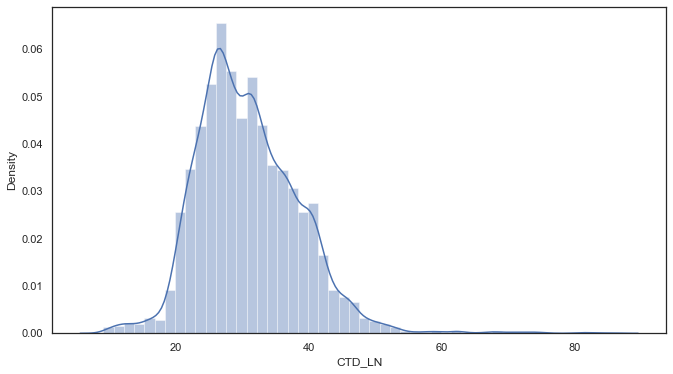

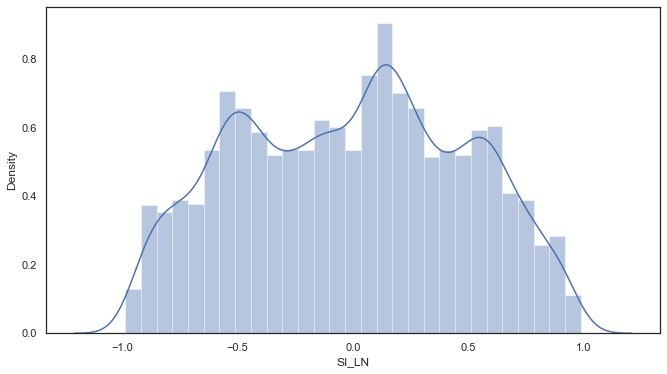

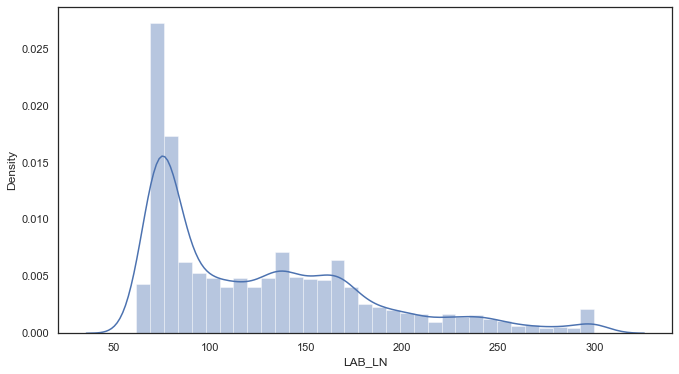

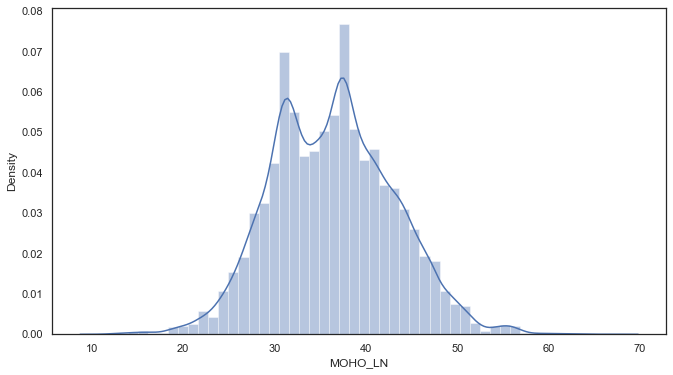

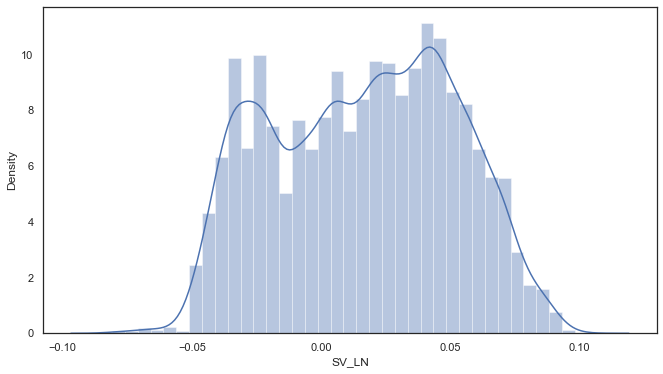

...

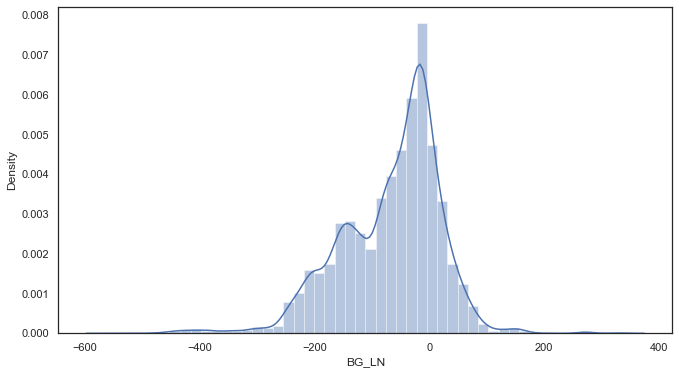

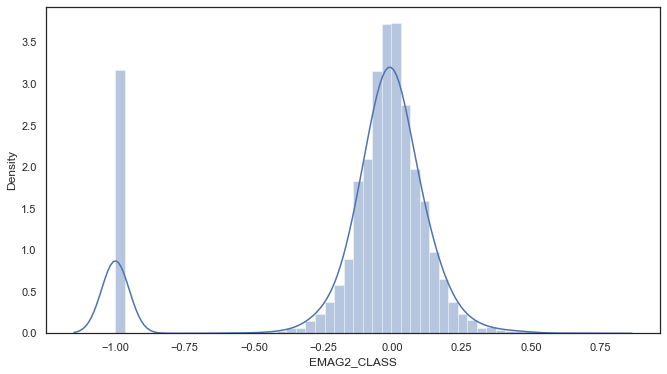

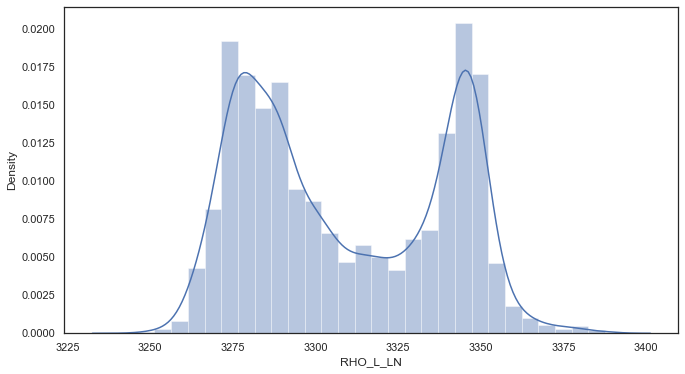

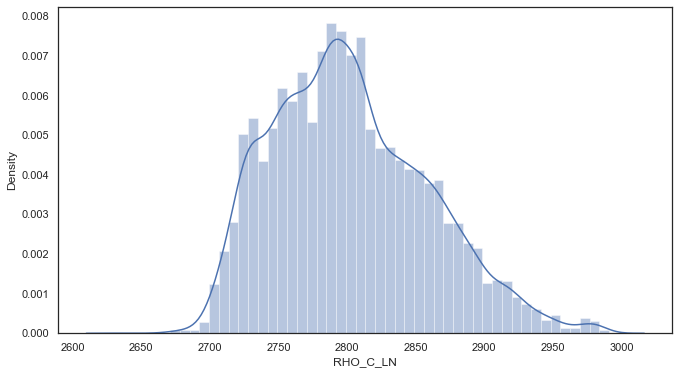

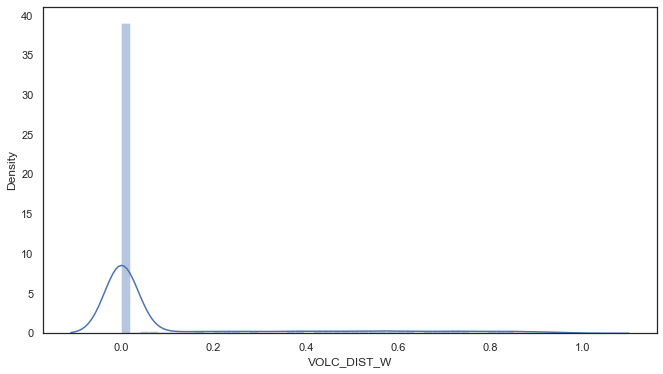

In [15]:
hf_W_copy_rab

print(hf_W_copy_rab.shape)

l = [hf_W_copy_rab[column] for column in features_ln[:-2]]

for i in l:
    plt.figure(figsize=(11,6))

    sns.distplot(i,  kde=True)



# 5- outliers detection for traget

In [16]:
# drop values greater than 200 labeled _n


####rb

hf_W_copy_ra_n  = hf_W_copy_ra.drop(hf_W_copy_ra[hf_W_copy_ra[target] >= 200].index)
hf_W_copy_ra_n  = hf_W_copy_ra_n.drop(hf_W_copy_ra_n[hf_W_copy_ra_n[target] <= 0].index)

hf_Afr_copy_ra_n = hf_Afr_copy_ra.drop(hf_Afr_copy_ra[hf_Afr_copy_ra[target] >= 200].index)
hf_Afr_copy_ra_n = hf_Afr_copy_ra_n.drop(hf_Afr_copy_ra_n[hf_Afr_copy_ra_n[target] <= 0].index)




######rg

hf_W_copy_rab_n  = hf_W_copy_rab.drop(hf_W_copy_rab[hf_W_copy_rab[target] >= 200].index)
hf_W_copy_rab_n  = hf_W_copy_rab_n.drop(hf_W_copy_rab_n[hf_W_copy_rab_n[target] <= 0].index)

hf_Afr_copy_rab_n = hf_Afr_copy_rab.drop(hf_Afr_copy_rab[hf_Afr_copy_rab[target] >= 200].index)
hf_Afr_copy_rab_n = hf_Afr_copy_rab_n.drop(hf_Afr_copy_rab_n[hf_Afr_copy_rab_n[target] <= 0].index)



hf_Afr_50_copy_ra_n = hf_Afr_50_copy_ra.drop(hf_Afr_50_copy_ra[hf_Afr_50_copy_ra[target] >= 200].index)
hf_Afr_50_copy_ra_n = hf_Afr_50_copy_ra_n.drop(hf_Afr_50_copy_ra_n[hf_Afr_50_copy_ra_n[target] <= 0].index)

hf_Afr_50_copy_rab_n = hf_Afr_50_copy_rab.drop(hf_Afr_50_copy_rab[hf_Afr_50_copy_rab[target] >= 200].index)
hf_Afr_50_copy_rab_n = hf_Afr_50_copy_rab_n.drop(hf_Afr_50_copy_rab_n[hf_Afr_50_copy_rab_n[target] <= 0].index)

print('hf_W_copy_ra')
print(len(hf_W_copy_ra))
print(f'max {hf_W_copy_ra[target].max()}')
print(f'min {hf_W_copy_ra[target].min()}')

print('hf_W_copy_ra_n')
print(len(hf_W_copy_ra_n))
print(f'max {hf_W_copy_ra_n[target].max()}')
print(f'min {hf_W_copy_ra_n[target].min()}')

print('hf_W_copy_rab')
print(len(hf_W_copy_rab))
print(f'max {hf_W_copy_rab[target].max()}')
print(f'min {hf_W_copy_rab[target].min()}')

print('hf_W_copy_rab_n')
print(len(hf_W_copy_rab_n))
print(f'max {hf_W_copy_rab_n[target].max()}')
print(f'min {hf_W_copy_rab_n[target].min()}')

#####
print('hf_Afr_copy_ra')
print(len(hf_Afr_copy_ra))
print(f'max {hf_Afr_copy_ra[target].max()}')
print(f'min {hf_Afr_copy_ra[target].min()}')

print('hf_Afr_copy_ra_n')
print(len(hf_Afr_copy_ra_n))
print(f'max {hf_Afr_copy_ra_n[target].max()}')
print(f'min {hf_Afr_copy_ra_n[target].min()}')

print('hf_Afr_copy_rab')
print(len(hf_Afr_copy_rab))
print(f'max {hf_Afr_copy_rab[target].max()}')
print(f'min {hf_Afr_copy_rab[target].min()}')

print('hf_Afr_copy_rab_n')
print(len(hf_Afr_copy_rab_n))
print(f'max {hf_Afr_copy_rab_n[target].max()}')
print(f'min {hf_Afr_copy_rab_n[target].min()}')



# save datasets for training


### rb
training_w_nod_ra_n  =    dir_p /'data'/'dataset'/'Preprocessed'/'Training_W_NOD_LN_ra.csv'

hf_Afr_nod_ra_n  =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_NOD_LN_ra.csv'

hf_Afr_50_nod_ra_n  =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_50_NOD_LN_ra.csv'



hf_W_copy_ra_n.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_W_copy_ra_n.reset_index( inplace=True,drop=True)
hf_W_copy_ra_n.to_csv(training_w_nod_ra_n , index=False, header=True, sep='\t')



####

hf_Afr_copy_ra_n.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_Afr_copy_ra_n.reset_index( inplace=True,drop=True)
hf_Afr_copy_ra_n.to_csv(hf_Afr_nod_ra_n , index=False, header=True, sep='\t')


####

hf_Afr_50_copy_ra_n.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_Afr_50_copy_ra_n.reset_index( inplace=True,drop=True)
hf_Afr_50_copy_ra_n.to_csv(hf_Afr_50_nod_ra_n , index=False, header=True, sep='\t')
####




##### rg

# save datasets for training


training_w_nod_rab_n  =    dir_p /'data'/'dataset'/'Preprocessed'/'Training_W_NOD_LN_rab.csv'

hf_Afr_nod_rab_n  =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_NOD_LN_rab.csv'

hf_Afr_50_nod_rab_n  =   dir_p /'data'/'dataset'/'Preprocessed'/'Training_Afr_50_NOD_LN_rab.csv'




hf_W_copy_rab_n.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_W_copy_rab_n.reset_index( inplace=True,drop=True)
hf_W_copy_rab_n.to_csv(training_w_nod_rab_n , index=False, header=True, sep='\t')



####

hf_Afr_copy_rab_n.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_Afr_copy_rab_n.reset_index( inplace=True,drop=True)
hf_Afr_copy_rab_n.to_csv(hf_Afr_nod_rab_n , index=False, header=True, sep='\t')



####

hf_Afr_50_copy_rab_n.sort_values(by=['lon', 'lat'], ascending=True, inplace=True)
hf_Afr_50_copy_rab_n.reset_index( inplace=True,drop=True)
hf_Afr_50_copy_rab_n.to_csv(hf_Afr_50_nod_rab_n , index=False, header=True, sep='\t')

####



hf_W_copy_ra
5775
max 787.5
min 0.8
hf_W_copy_ra_n
5712
max 197.0
min 0.8
hf_W_copy_rab
12626
max 5146.0
min -3.0
hf_W_copy_rab_n
12511
max 199.0
min 0.8
hf_Afr_copy_ra
917
max 787.5
min 6.0
hf_Afr_copy_ra_n
871
max 197.0
min 6.0
hf_Afr_copy_rab
1759
max 787.5
min 1.0
hf_Afr_copy_rab_n
1711
max 197.7
min 1.0


 less than 0 : 0,   0.0 %
 greater than 200 : 62, 0.0107 %
 total length before elimination : 5775
 total length after elimination values < 200 : 5712


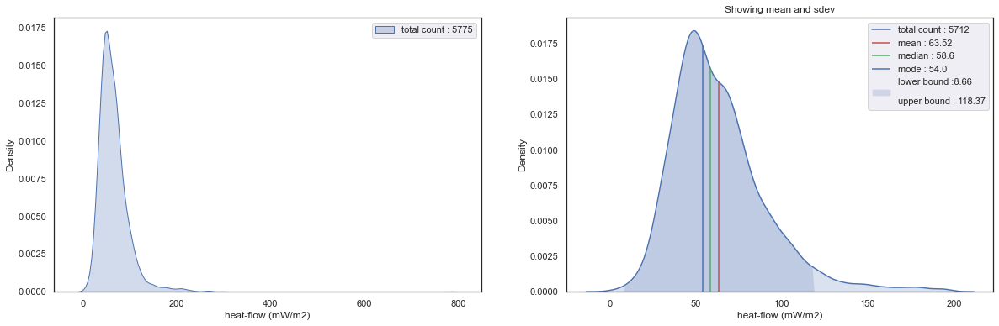

In [17]:
fig, axes = plt.subplots(1,2, figsize=(20, 6))


# data is positvely skewed

sns.set(font_scale = 1)

print(f' less than 0 : {len(hf_W_copy_ra[hf_W_copy_ra[target] <=0])},   {round(len(hf_W_copy_ra[hf_W_copy_ra[target] <= 0])/len(hf_W_copy_ra), 4)} %')
print(f' greater than 200 : {len(hf_W_copy_ra[hf_W_copy_ra[target] > 200])}, {round(len(hf_W_copy_ra[hf_W_copy_ra[target] > 200])/len(hf_W_copy_ra), 4)} %')
print(f' total length before elimination : {len(hf_W_copy_ra)}')
print(f' total length after elimination values < 200 : {len(hf_W_copy_ra_n)}')
#print(f' total length after transforming values < 200 : {len(hf_W_copy_ra_c)}')


######

sns.kdeplot(hf_W_copy_ra[target], shade=True,  ax=axes[0],  label=f'total count : {len(hf_W_copy_ra[target])}')

axes[0].legend()

#####
sns.kdeplot(hf_W_copy_ra_n[target], shade=False,  ax=axes[1], label=f'total count : {len(hf_W_copy_ra_n)}')
kdeline = axes[1].lines[0]
xs = kdeline.get_xdata()
ys = kdeline.get_ydata()

mean = hf_W_copy_ra_n[target].mean()
median = hf_W_copy_ra_n[target].median()
mode = hf_W_copy_ra_n[target].mode()
sdev = hf_W_copy_ra_n[target].std()
left = mean - 2*sdev
right = mean + 2*sdev


axes[1].set_title('Showing mean and sdev') 
axes[1].vlines(mean, 0, np.interp(mean, xs, ys),   label= f'mean : {round(mean,2)}',  color='r')
axes[1].vlines(median, 0, np.interp(median, xs, ys),  label= f'median : {round(median,2)}',  color='g')
axes[1].vlines(mode, 0, np.interp(mode, xs, ys),  label= f'mode : {round(mode[0],2)}',  color='b')

axes[1].fill_between(xs, 0, ys, where=(left <= xs) & (xs <= right), interpolate=True,  alpha=0.2)

axes[1].fill_between(xs, 0, ys, alpha=0.2, facecolor ='b', label= f'''lower bound :{round(left,2)} \n 
upper bound : {round(right, 2)}''' )
axes[1].set_ylim(ymin=0)

axes[1].legend()

#####
"""
sns.kdeplot(hf_W_copy_ra_c[target], shade=False,  ax=axes[2], label=f'total count : {len(hf_W_copy_ra_c)}')
kdeline = axes[2].lines[0]
xs = kdeline.get_xdata()
ys = kdeline.get_ydata()

mean = hf_W_copy_ra_c[target].mean()
median = hf_W_copy_ra_c[target].median()
mode = hf_W_copy_ra_c[target].mode()
sdev = hf_W_copy_ra_c[target].std()
left = mean - 2*sdev
right = mean + 2*sdev
axes[2].set_title('Showing mean and sdev') 
axes[2].vlines(mean, 0, np.interp(mean, xs, ys),   label= f'mean : {round(mean,2)}',  color='r')
axes[2].vlines(median, 0, np.interp(median, xs, ys),  label= f'median : {round(median,2)}',  color='g')
axes[2].vlines(mode, 0, np.interp(mode, xs, ys),  label= f'mode : {round(mode[0],2)}',  color='b')

axes[2].fill_between(xs, 0, ys, where=(left <= xs) & (xs <= right), interpolate=True,  alpha=0.2)

axes[2].fill_between(xs, 0, ys, alpha=0.2, facecolor ='b', label= f'''lower bound :{round(left,2)} \n 
upper bound : {round(right, 2)}''' )
axes[2].set_ylim(ymin=0)

axes[2].legend()"""

plt.show()



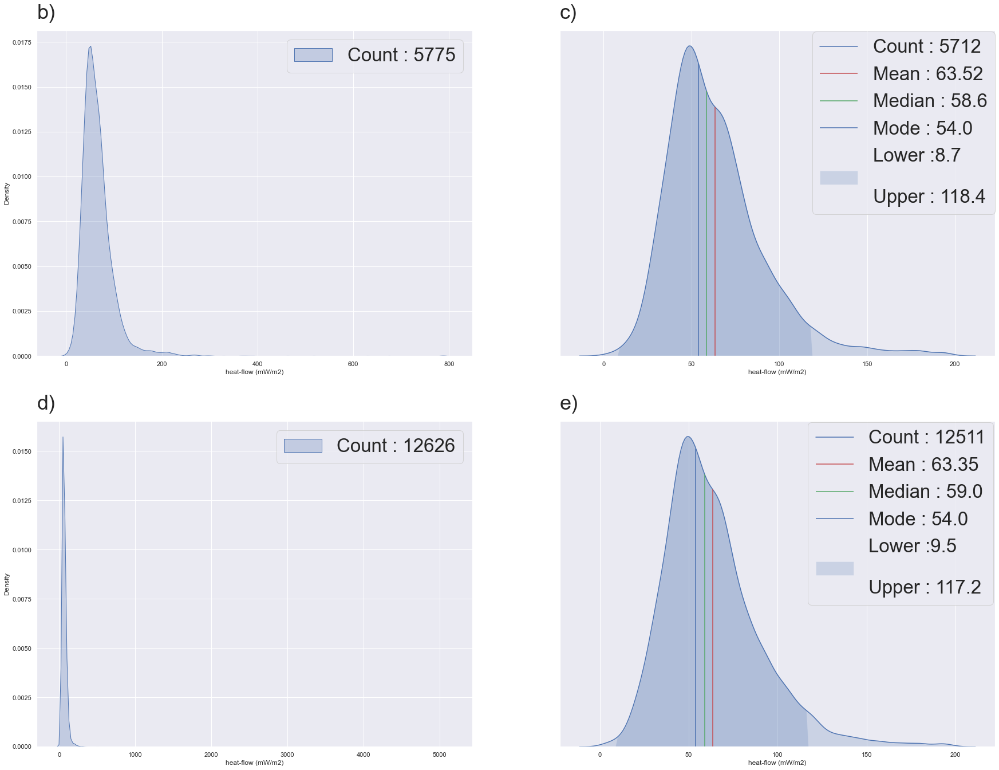

In [18]:
sub_figs = list('abcdefghijklmnopqrstuvwxyz')

fig, axes = plt.subplots(2,2, figsize=(30, 23))


# data is positvely skewed

sns.set(font_scale = 3)



######

sns.kdeplot(hf_W_copy_ra[target], shade=True,  ax=axes[0][0],  label=f'Count : {len(hf_W_copy_ra[target])}')
sns.kdeplot(hf_W_copy_rab[target], shade=True,  ax=axes[1][0],  label=f'Count : {len(hf_W_copy_rab[target])}')

axes[0][0].legend()
axes[1][0].legend()

axes[0][0].set_title(f'{sub_figs[1]})', loc ='left', pad=20)

axes[1][0].set_title(f'{sub_figs[3]})', loc ='left', pad=20)

#####
sns.kdeplot(hf_W_copy_ra_n[target], shade=False,  ax=axes[0][1], label=f'Count : {len(hf_W_copy_ra_n)}')


kdeline = axes[0][1].lines[0]
xs = kdeline.get_xdata()
ys = kdeline.get_ydata()

mean = hf_W_copy_ra_n[target].mean()
median = hf_W_copy_ra_n[target].median()
mode = hf_W_copy_ra_n[target].mode()
sdev = hf_W_copy_ra_n[target].std()
left = mean - 2*sdev
right = mean + 2*sdev

axes[0][1].vlines(mean, 0, np.interp(mean, xs, ys),   label= f'Mean : {round(mean,2)}',  color='r')
axes[0][1].vlines(median, 0, np.interp(median, xs, ys),  label= f'Median : {round(median,2)}',  color='g')
axes[0][1].vlines(mode, 0, np.interp(mode, xs, ys),  label= f'Mode : {round(mode[0],2)}',  color='b')

axes[0][1].fill_between(xs, 0, ys, where=(left <= xs) & (xs <= right), interpolate=True,  alpha=0.2)

axes[0][1].fill_between(xs, 0, ys, alpha=0.2, facecolor ='b', label= f'''Lower :{round(left,1)} \n 
Upper : {round(right, 1)}''' )
axes[0][1].set_ylim(ymin=0)

axes[0][1].legend(loc=[0.58,0.435])
axes[0][1].axes.get_yaxis().set_visible(False)

axes[0][1].set_title(f'{sub_figs[2]})', loc ='left', pad=20)

##

sns.kdeplot(hf_W_copy_rab_n[target], shade=False,  ax=axes[1][1], label=f'Count : {len(hf_W_copy_rab_n)}')

kdeline = axes[1][1].lines[0]
xs = kdeline.get_xdata()
ys = kdeline.get_ydata()

mean = hf_W_copy_rab_n[target].mean()
median = hf_W_copy_rab_n[target].median()
mode = hf_W_copy_rab_n[target].mode()
sdev = hf_W_copy_rab_n[target].std()
left = mean - 2*sdev
right = mean + 2*sdev

axes[1][1].vlines(mean, 0, np.interp(mean, xs, ys),   label= f'Mean : {round(mean,2)}',  color='r')
axes[1][1].vlines(median, 0, np.interp(median, xs, ys),  label= f'Median : {round(median,2)}',  color='g')
axes[1][1].vlines(mode, 0, np.interp(mode, xs, ys),  label= f'Mode : {round(mode[0],2)}',  color='b')

axes[1][1].fill_between(xs, 0, ys, where=(left <= xs) & (xs <= right), interpolate=True,  alpha=0.2)

axes[1][1].fill_between(xs, 0, ys, alpha=0.2, facecolor ='b', label= f'''Lower :{round(left,1)} \n 
Upper : {round(right, 1)}''' )
axes[1][1].set_ylim(ymin=0)

axes[1][1].legend(loc=[0.57,0.435])

axes[1][1].axes.get_yaxis().set_visible(False)

axes[1][1].set_title(f'{sub_figs[4]})', loc ='left', pad=20)

plt.show()



reorder covariates based on its corelation to traget to check for multicolinarity

# rating best

hf_ra_n
hf_rab_n


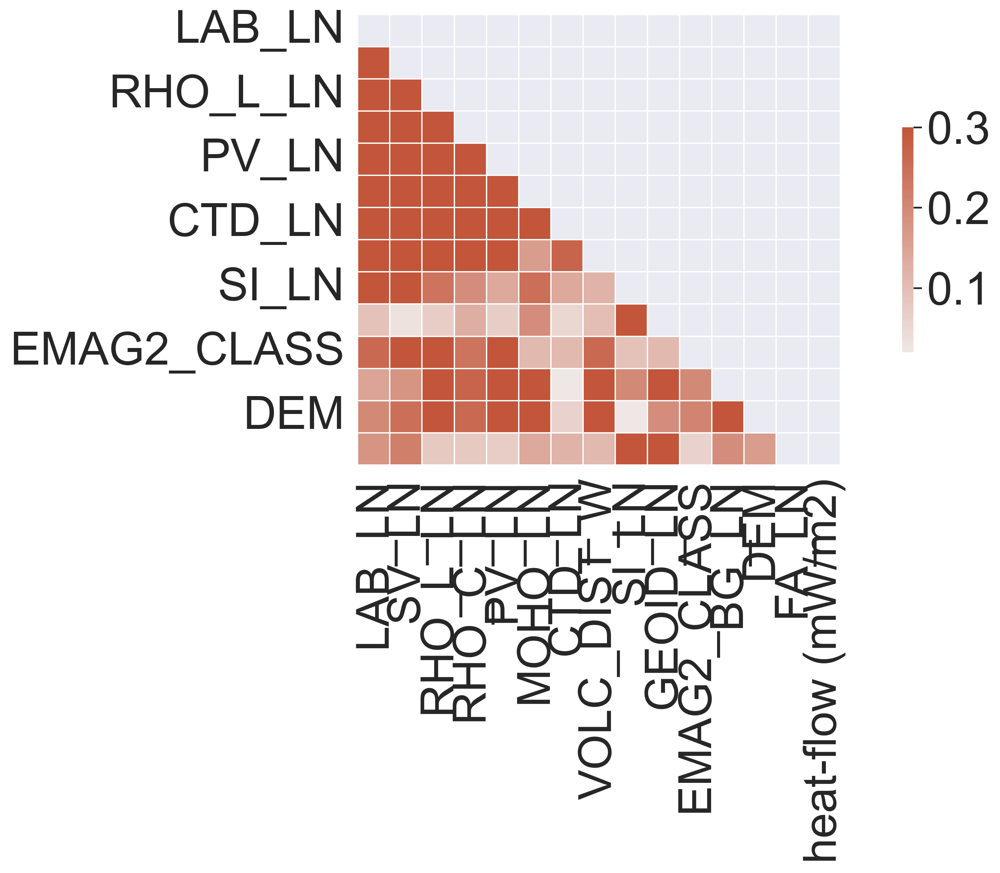

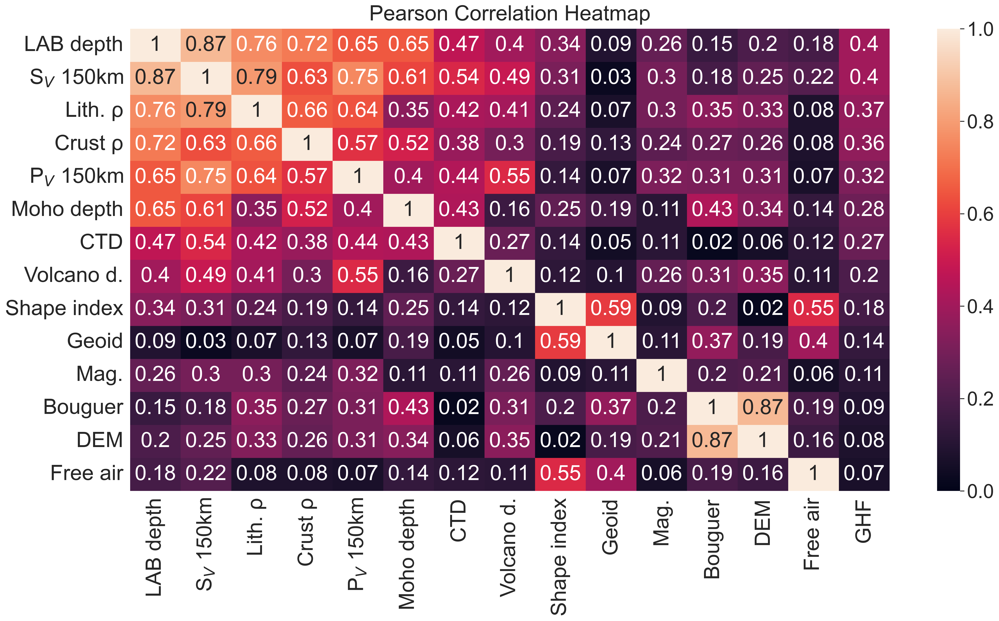

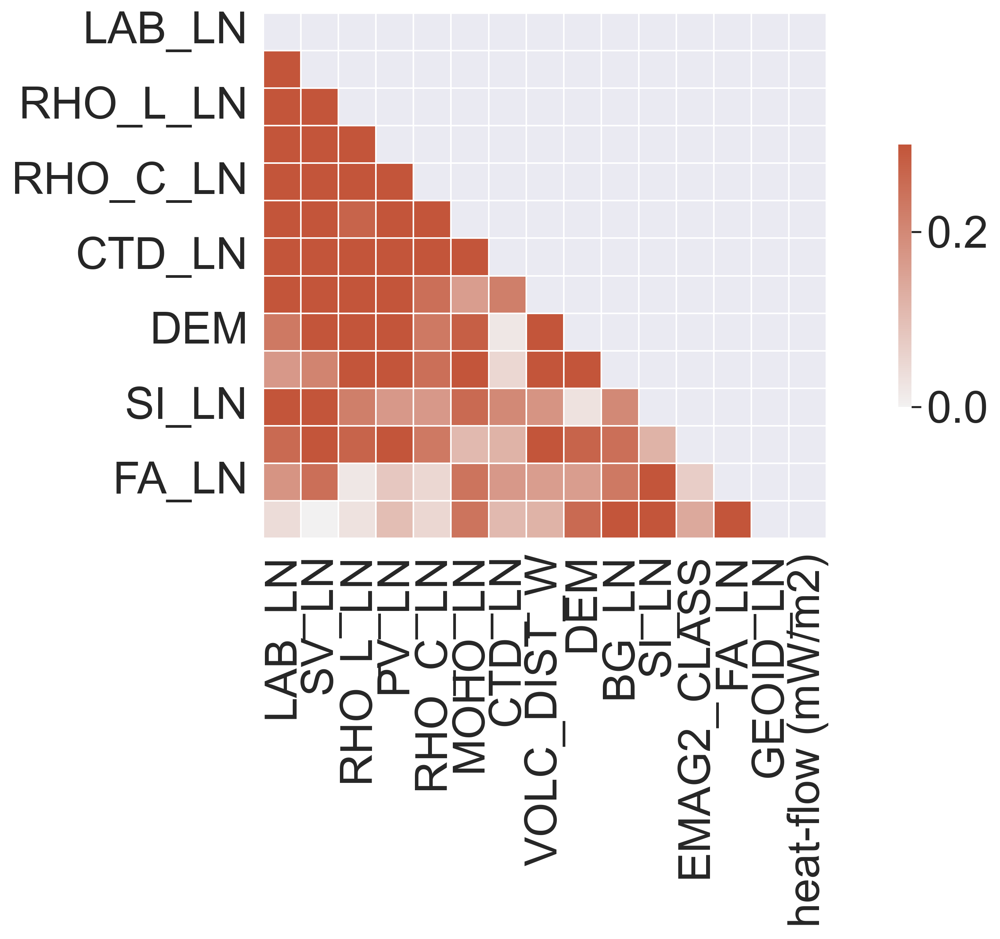

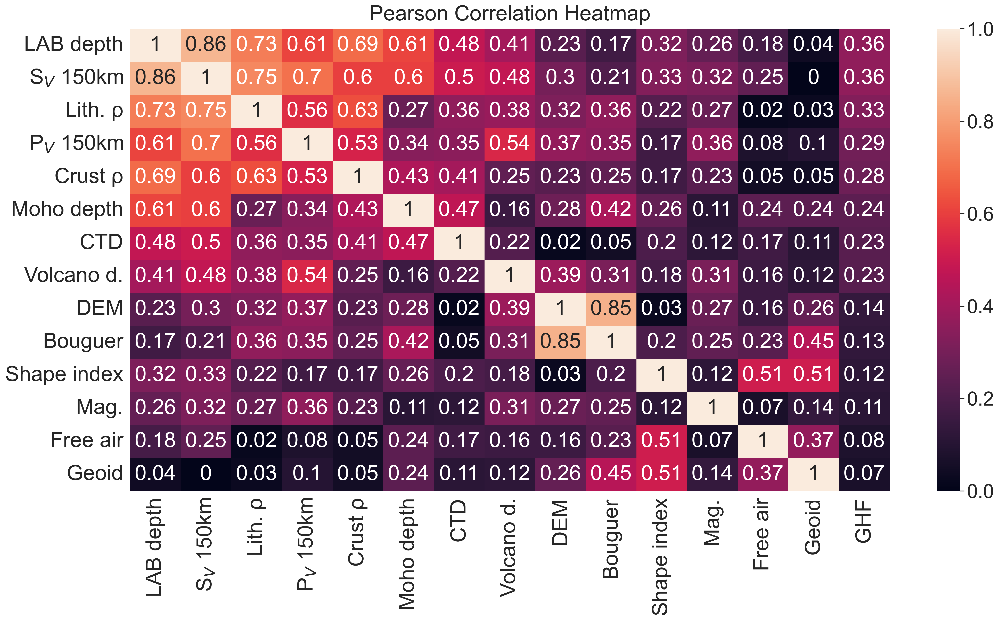

In [19]:

hfs_dict = {
'hf_ra_n': hf_W_copy_ra_n[features_ghf_ln], 
'hf_rab_n': hf_W_copy_rab_n[features_ghf_ln],
}


for key, hf_tmp in hfs_dict.items() :
    print(key, end='\n')
    corr = hf_tmp.corr().abs().round(2)
    corr.sort_values(by=target, ascending=False, inplace=True)

    corr.drop(target, inplace=True)

    corr.index.to_list().append(target)

    columns_titles = corr.index.to_list()
    columns_titles.append(target)

    corr=corr.reindex(columns=columns_titles)


    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(16, 6), dpi=300)

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    
    obs_tmp = obs.set_index('OBS_REF_LN')
    y_axis_labels = [obs_tmp.loc[feature, 'LABELS'] for feature in corr.index]

    x_axis_labels = copy.deepcopy(y_axis_labels)
    
    x_axis_labels.append('GHF')
    # Increase the size of the heatmap.
    plt.figure(figsize=(24, 12), dpi=300)
    sns.set(font_scale=2.5)
    # Store heatmap object in a variable to easily access it when you want to include more features (such as title).
    # Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
    heatmap = sns.heatmap(corr, vmin=0, vmax=1, annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
    # Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
    heatmap.set_title('Pearson Correlation Heatmap', fontdict={'fontsize':30}, pad=12);
    heatmap.tick_params(labelsize=30)


    # create seabvorn heatmap with required labels
    #sns.heatmap(flights_df, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

hf_ra_n
hf_rab_n


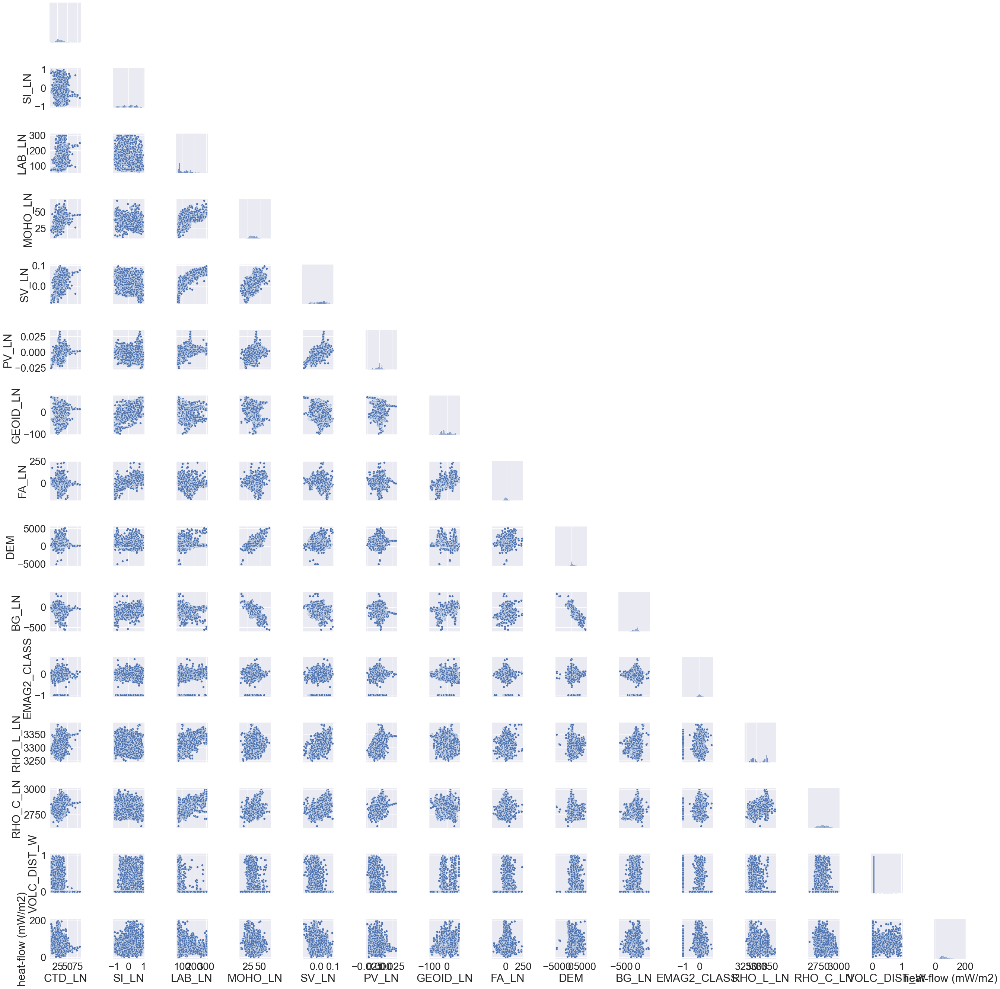

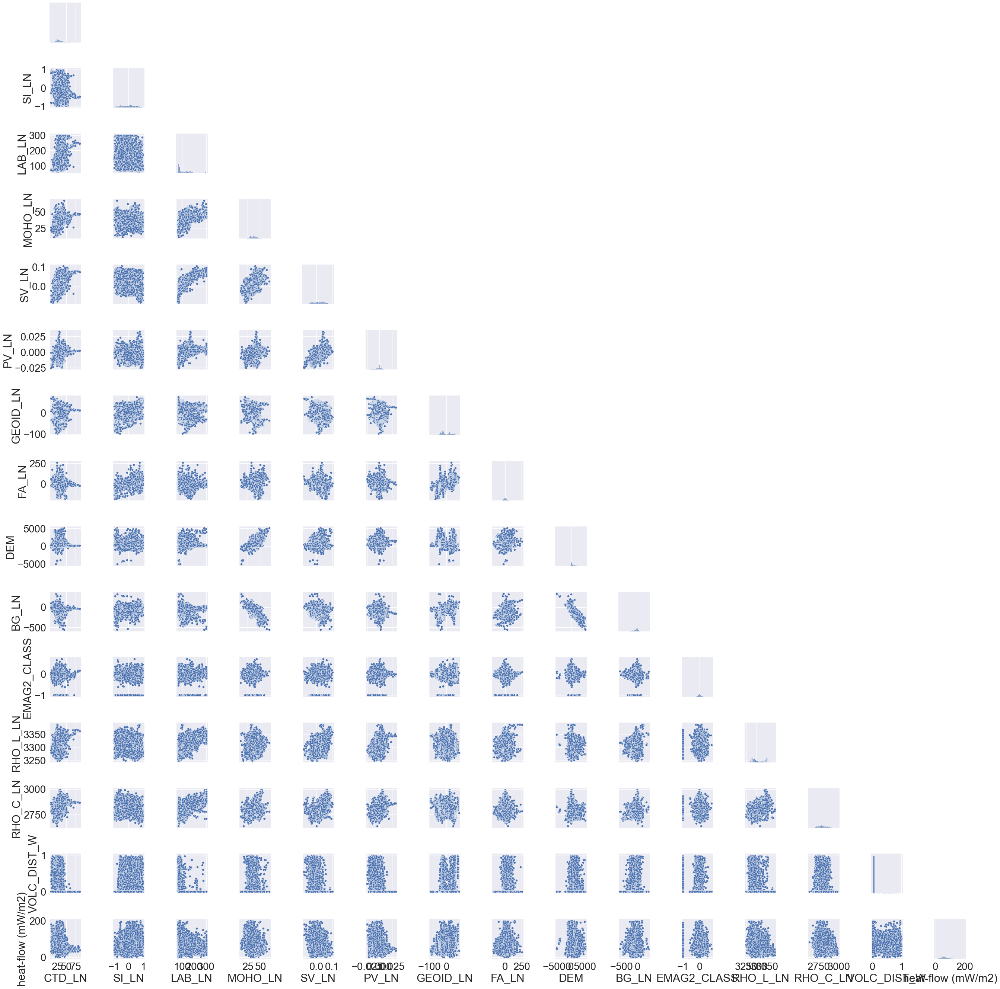

In [20]:
sns.set_context( rc={"font.size":8,"axes.titlesize":8,"axes.labelsize":30})   

for key, hf_tmp in hfs_dict.items() :
    print(key, end='\n')
    sns.pairplot(data = hf_tmp[features_ghf_ln],            
                palette=sns.color_palette('coolwarm', n_colors=200) , corner=True)


hf_ra_n


<Figure size 936x576 with 0 Axes>

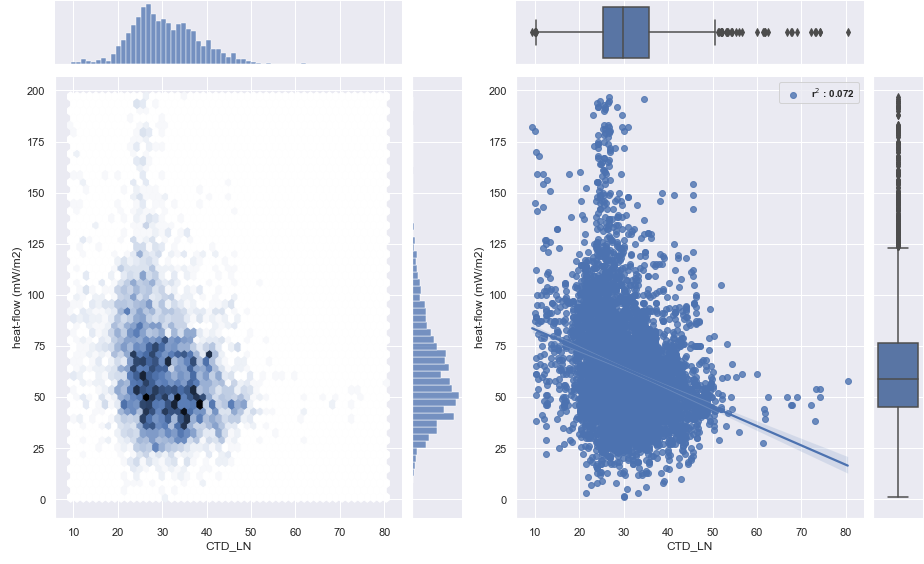

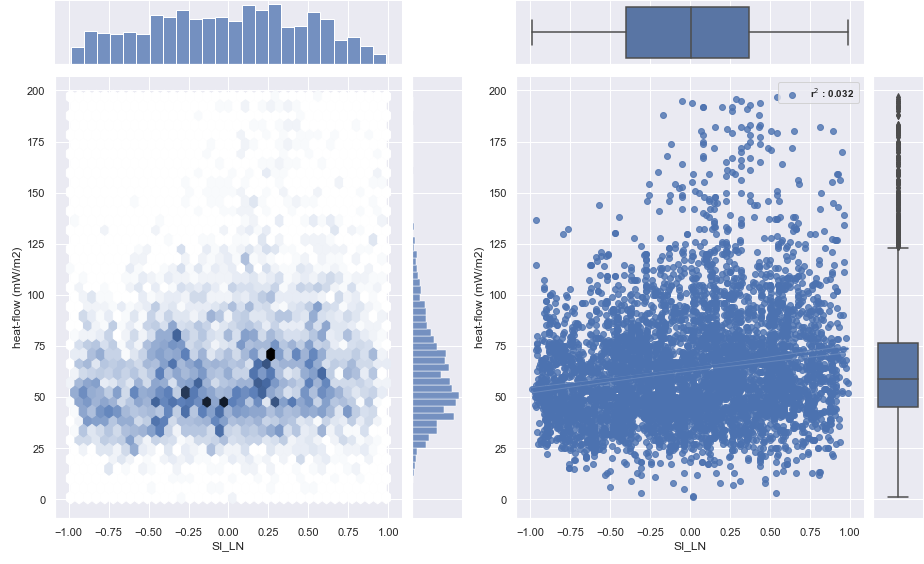

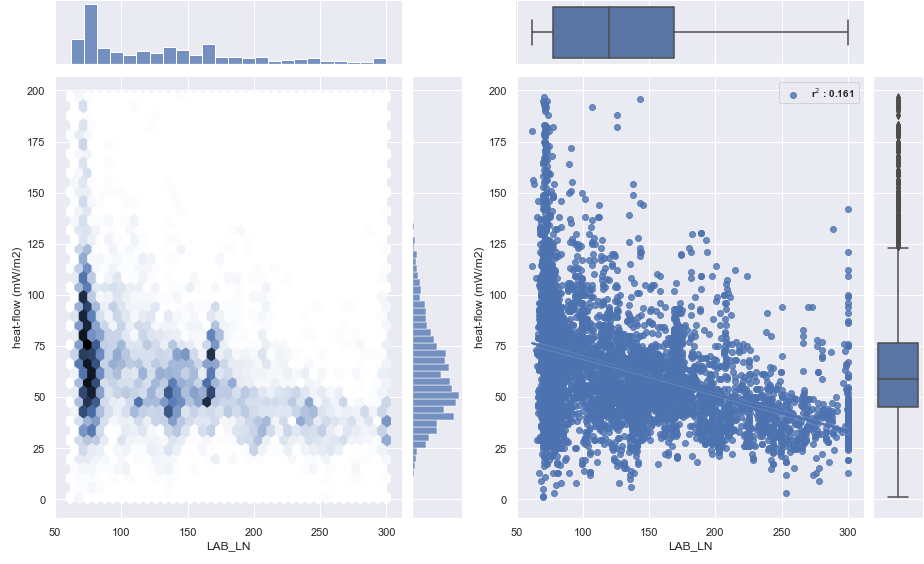

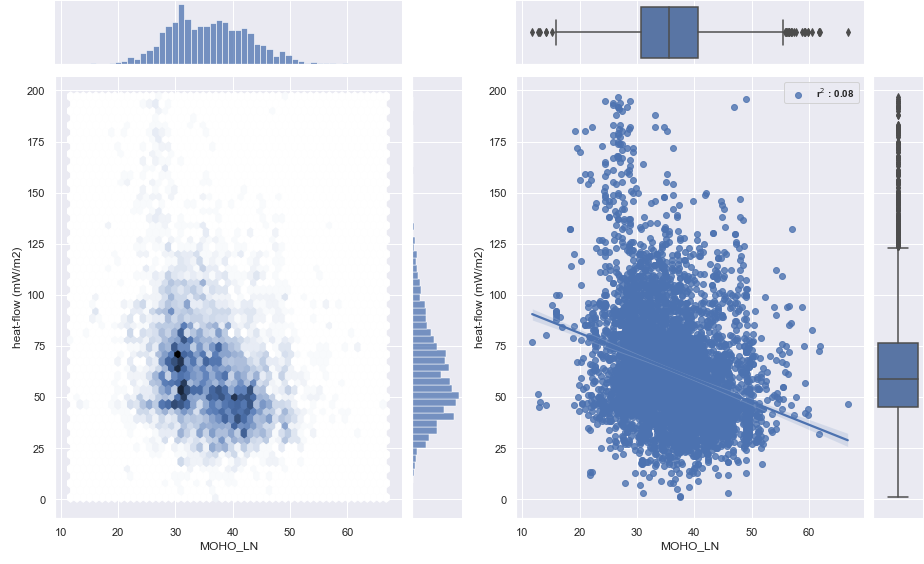

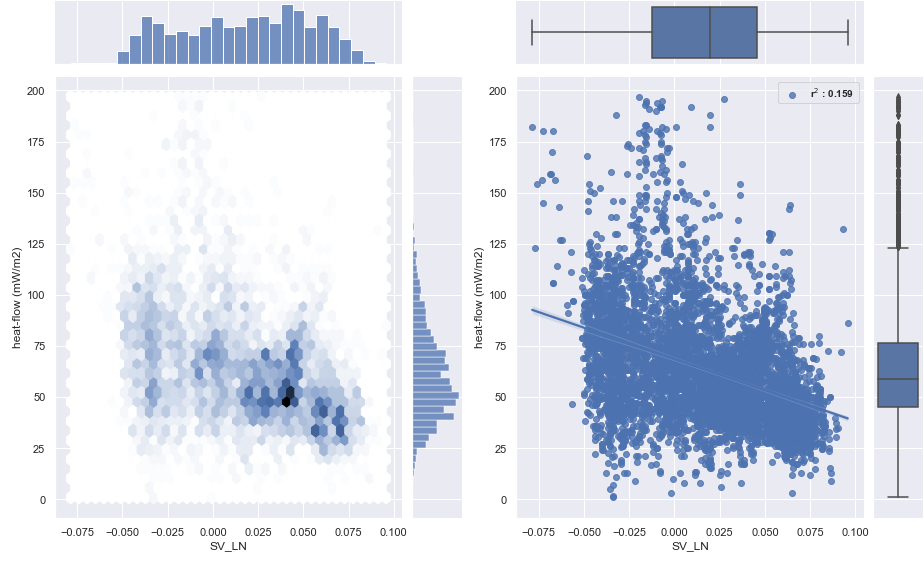

...

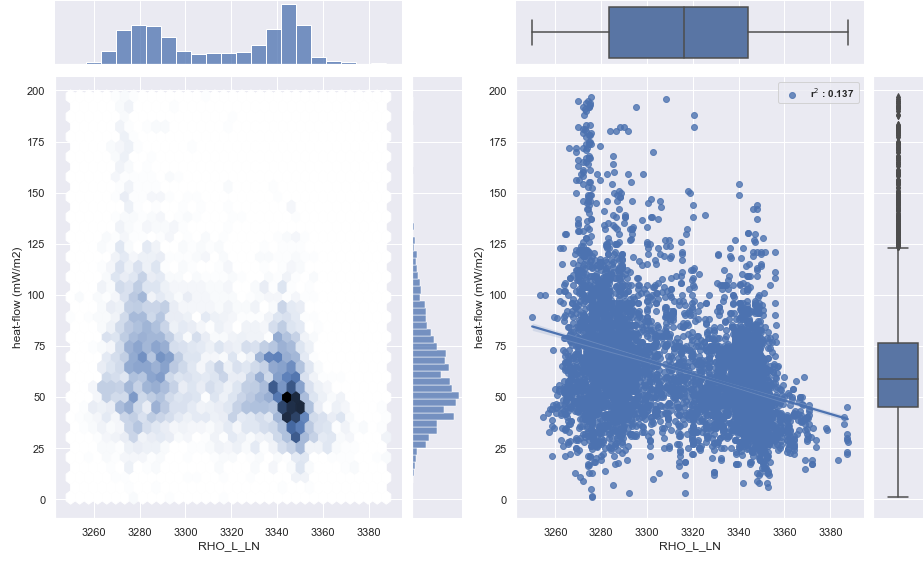

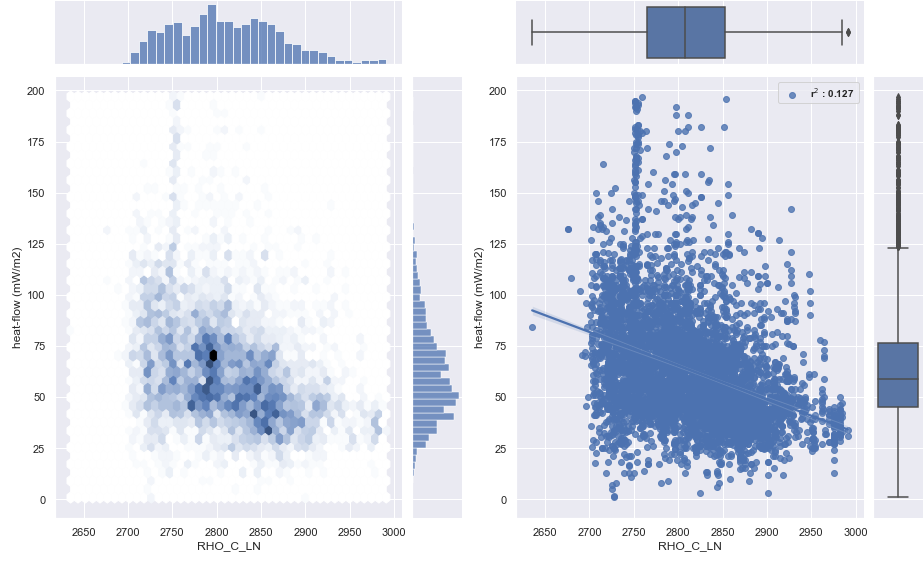

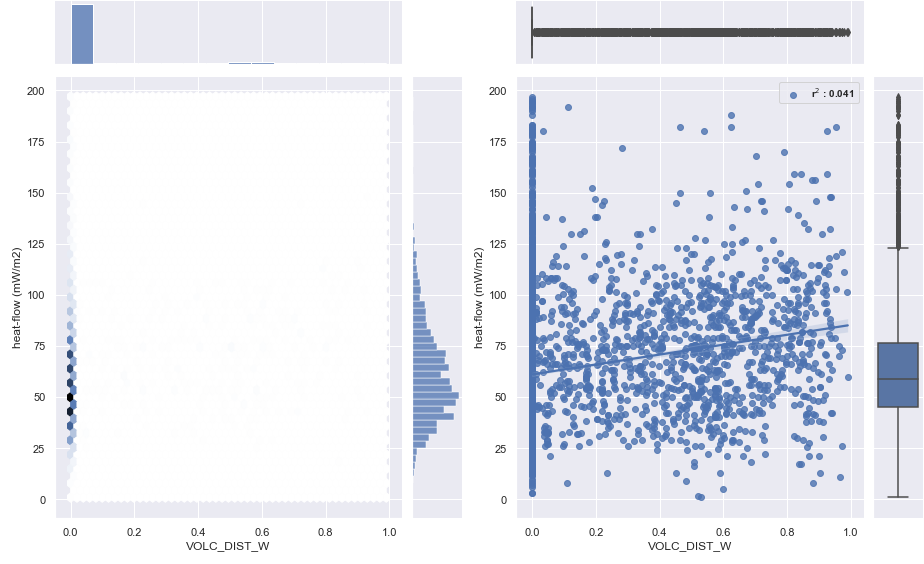

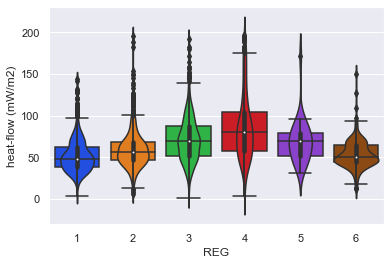

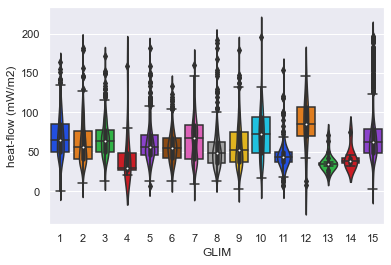

hf_rab_n


<Figure size 936x576 with 0 Axes>

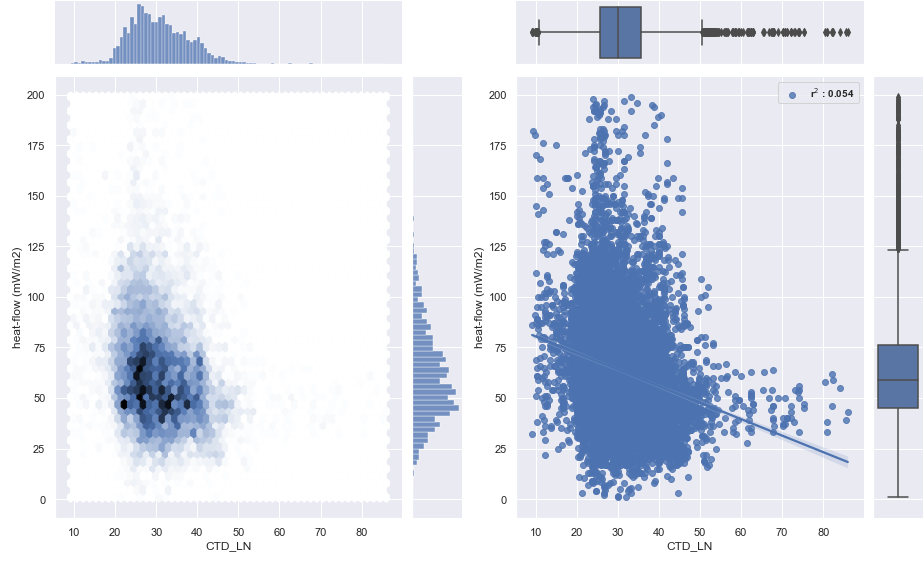

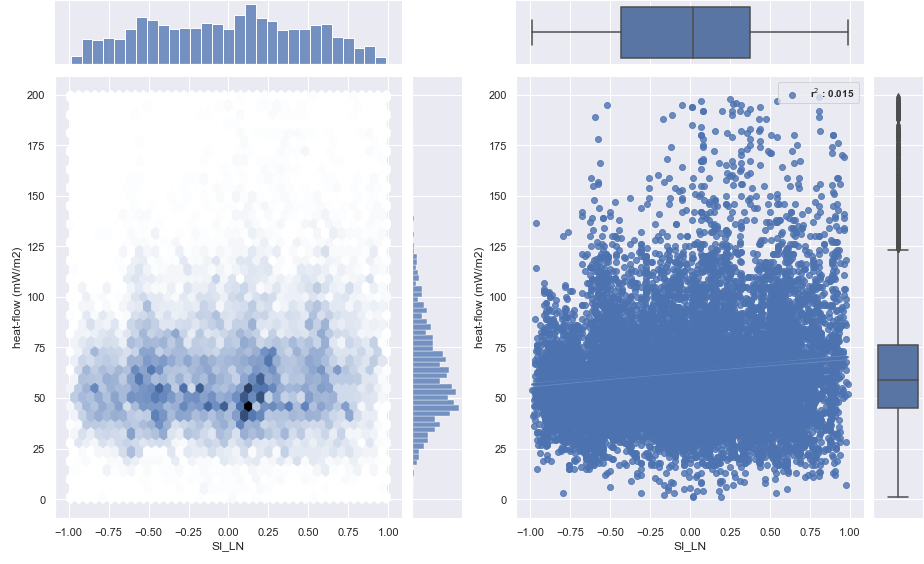

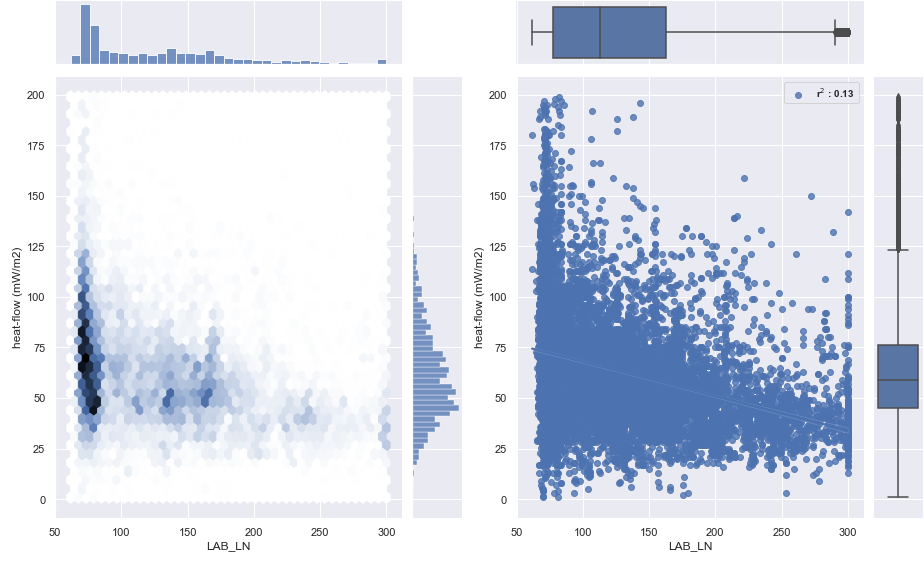

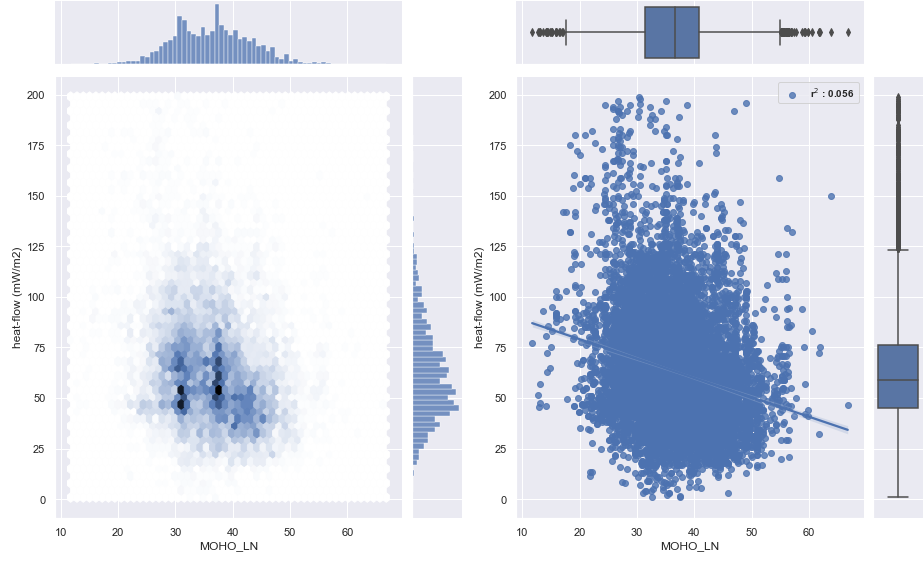

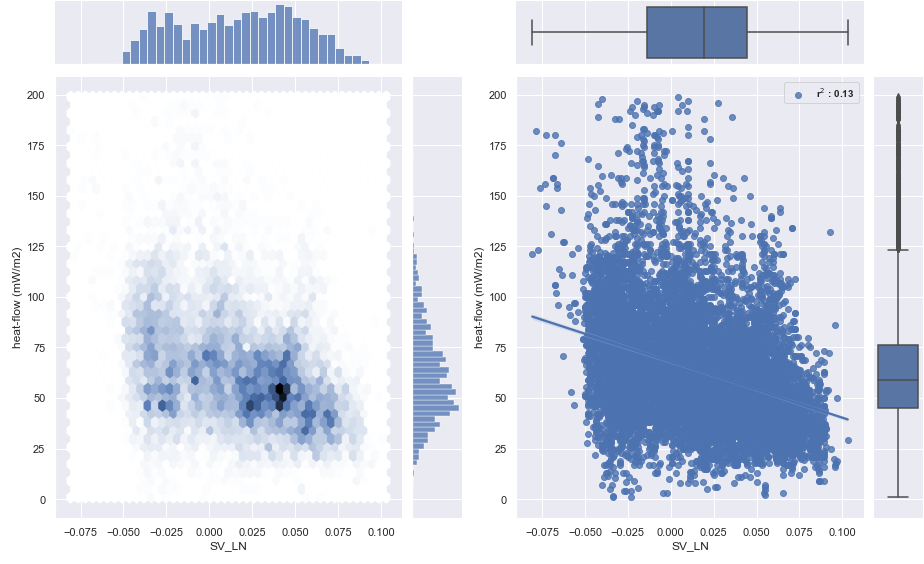

...

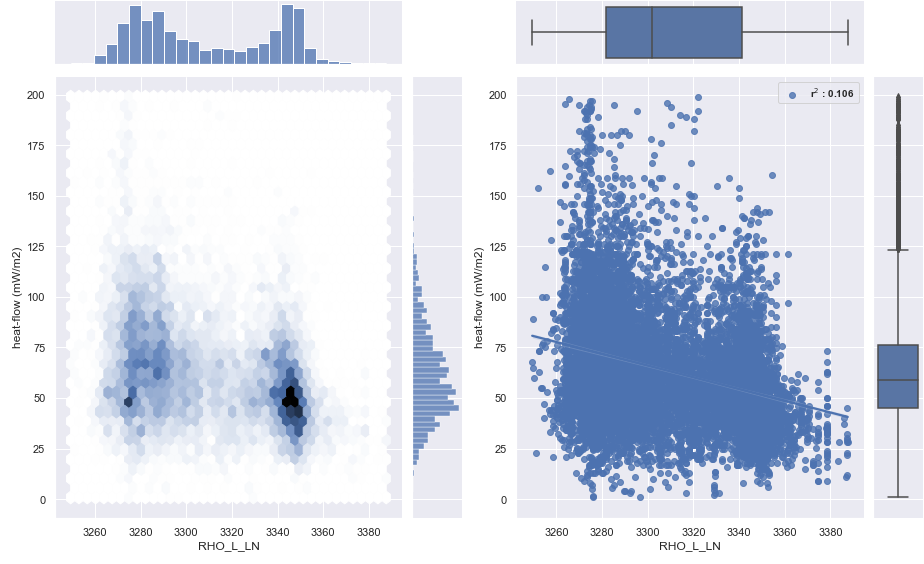

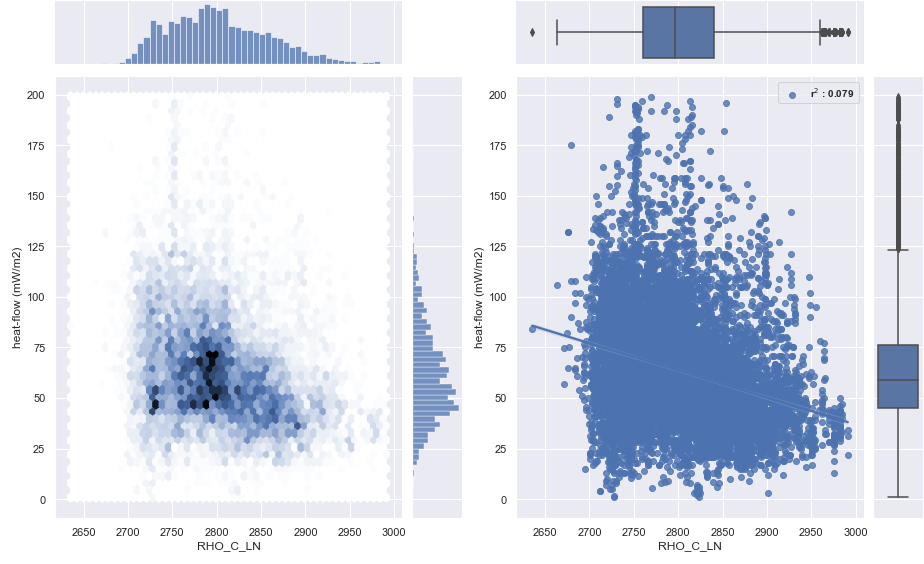

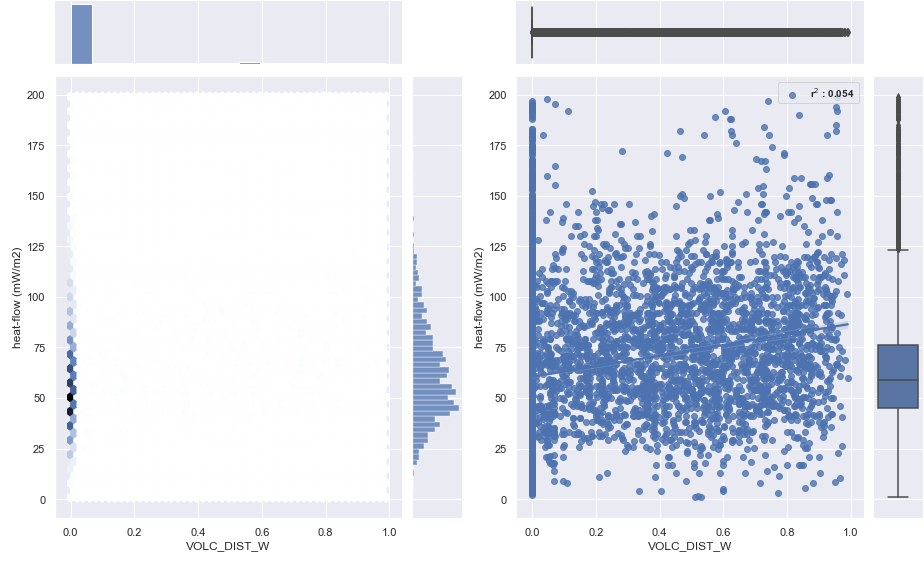

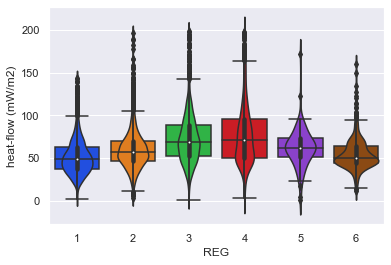

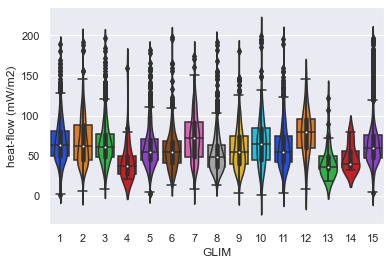

In [22]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns; sns.set()


#no need to correlate target with observable as they are not corelated
#kind : { "scatter" | "kde" | "hist" | "hex" | "reg" | "resid" }

for key, hf_tmp in hfs_dict.items() :
    fig = plt.figure(figsize=(13,8))
    gs = gridspec.GridSpec(4, 4)
    print(key)
    for i, feature in enumerate(obs['OBS_REF_LN']):

                # An lmplot
        if feature in ['GLIM','REG']:
            g0 = sns.boxplot(x=hf_tmp[feature], y=hf_tmp[target], palette='bright')
            g1 = sns.violinplot(x=hf_tmp[feature], y=hf_tmp[target], palette='bright')
        else:

            # An lmplot
            g0 = sns.jointplot(hf_tmp[feature], hf_tmp[target], palette='bright',  kind="hex")
            # A PairGrid
            #g1 = sns.jointplot(data=hf_copy_rb[features_ex], x=feature, y=target,  palette='bright', kind='reg')

            g1 = sns.JointGrid(hf_tmp[feature], hf_tmp[target],  palette='bright');
            g1.plot(sns.regplot, sns.boxplot)

            legend_properties = {'weight':'bold','size':10}
            g1.ax_joint.legend(prop=legend_properties,loc='upper right', 
                           labels=[f'r$^2$ : {round(stats.pearsonr(hf_tmp[feature], hf_tmp[target])[0] ** 2,3)}'])
            # A FacetGrid



            fig = plt.figure(figsize=(13,8))
            gs = gridspec.GridSpec(1, 2)

            mg0 = SeabornFig2Grid(g0, fig, gs[0])
            mg1 = SeabornFig2Grid(g1, fig, gs[1])


            gs.tight_layout(fig)
        #gs.update(top=0.7)

        plt.show()

Biggest insight here is that all variables have a different scale, there are many outliers for most 
of them and no one seem really close to normality

# 5-Outlier detection

############################################################
Now tuning IF for W.
Optimization has terminated for W.
for Automatic optimization
Lower bound:-0.5416068593222867 
Upper bound:-0.3816957631648838

The data has 301 anomolus points and the data points are the following for  : 
Percentage of anomalies in data: 5.27


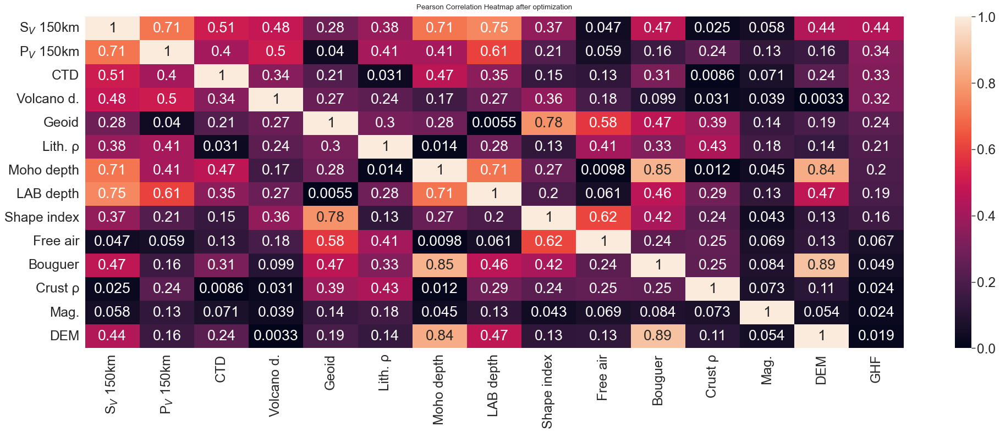

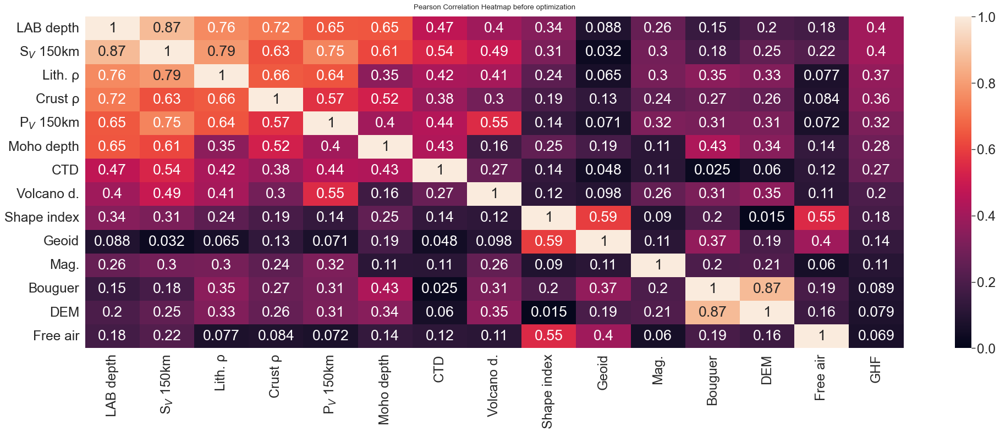

Without outlier detection
r2 before : 3.259, mean : 0.204

 < 0.1 : 5
 > 0.5 : 0
####################
Ranked 1 best paramter and score
score :  0.45194
parameter : {'bootstrap': False, 'contamination': 0.1102, 'max_features': 2, 'max_samples': 1790, 'n_estimators': 200, 'n_jobs': None, 'random_state': 42, 'verbose': 0, 'warm_start': False}

####################
Automatic tuned paramter and score
r2 : 2.628, mean : 0.164
score :  0.46374
 < 0.1 : 5
 > 0.5 : 0
parameter : {'bootstrap': True, 'contamination': 0.05260000000000001, 'max_features': 2, 'max_samples': 835, 'n_estimators': 200}


 Offset for Isolation forest
-0.5058531002057549


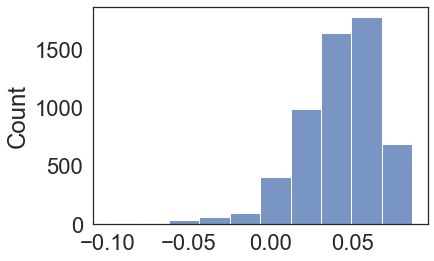

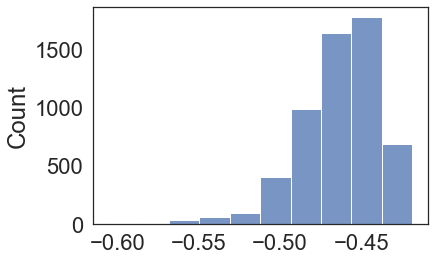

############################################################
Now tuning IF for Afr.
Optimization has terminated for Afr.
for Automatic optimization
Lower bound:-0.6744315313733245 
Upper bound:-0.24278439283585768

The data has 19 anomolus points and the data points are the following for  : 
Percentage of anomalies in data: 2.18


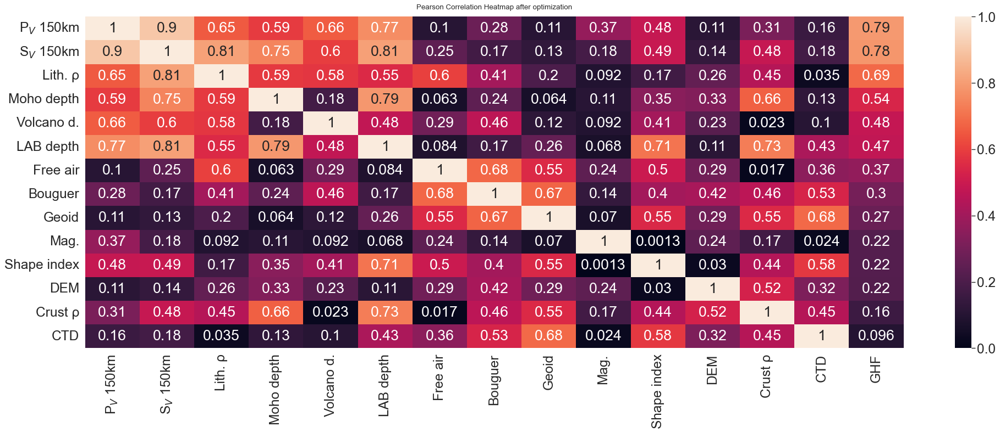

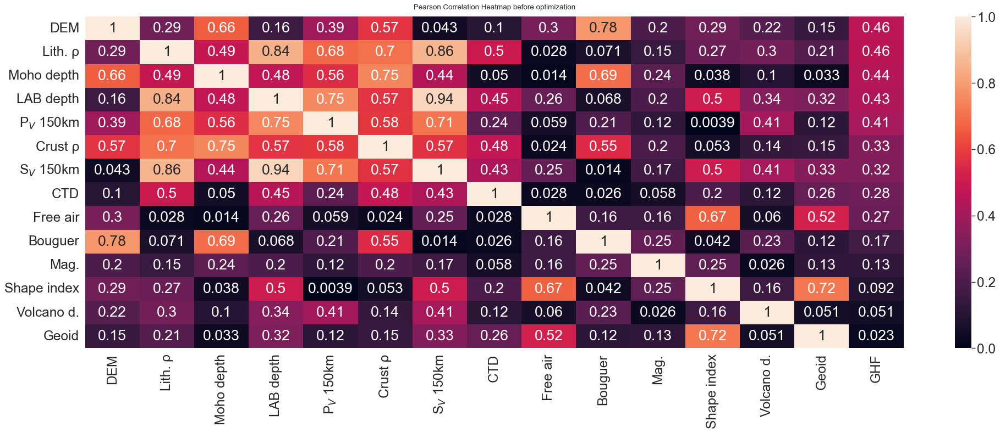

Without outlier detection
r2 before : 3.882, mean : 0.243

 < 0.1 : 4
 > 0.5 : 0
####################
Ranked 1 best paramter and score
score :  0.46596
parameter : {'bootstrap': True, 'contamination': 0.1126, 'max_features': 3, 'max_samples': 835, 'n_estimators': 600, 'n_jobs': None, 'random_state': 42, 'verbose': 0, 'warm_start': False}

####################
Automatic tuned paramter and score
r2 : 5.604, mean : 0.35
score :  0.4672
 < 0.1 : 1
 > 0.5 : 4
parameter : {'bootstrap': True, 'contamination': 0.0207, 'max_features': 3, 'max_samples': 835, 'n_estimators': 300}


 Offset for Isolation forest
-0.5895888065869742


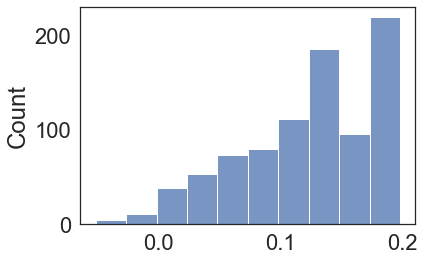

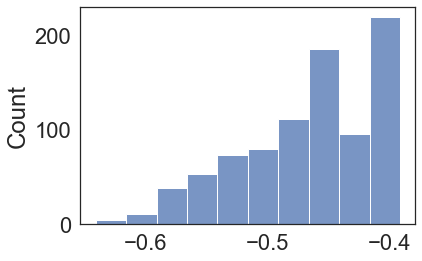

############################################################
Now tuning IF for Afr_50.
Optimization has terminated for Afr_50.
for Automatic optimization
Lower bound:-0.6786667931648932 
Upper bound:-0.2501472750138331

The data has 19 anomolus points and the data points are the following for  : 
Percentage of anomalies in data: 2.18


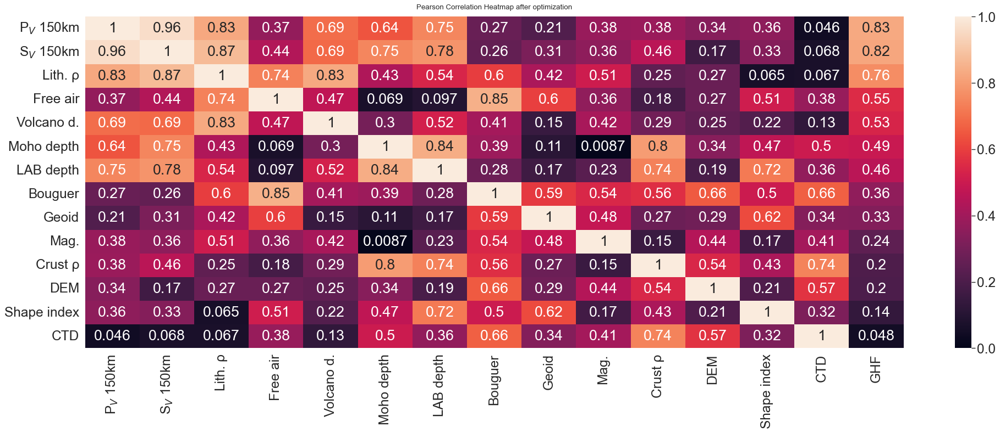

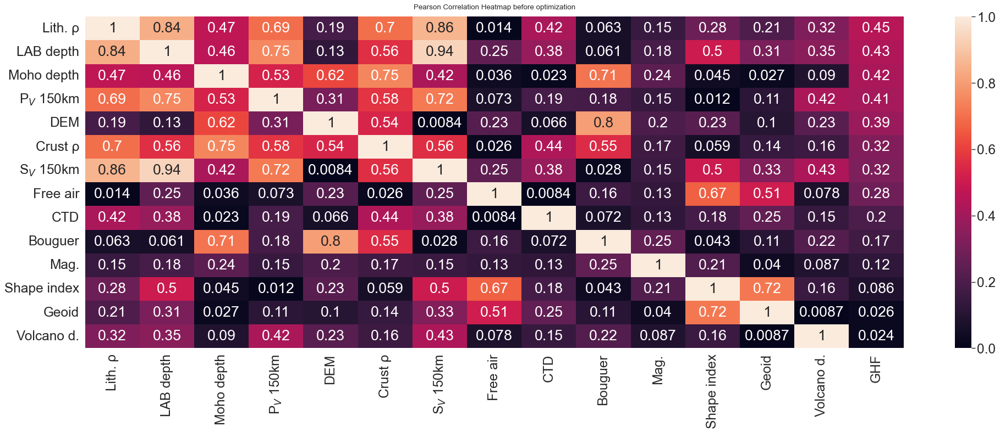

Without outlier detection
r2 before : 3.655, mean : 0.228

 < 0.1 : 4
 > 0.5 : 0
####################
Ranked 1 best paramter and score
score :  0.46545
parameter : {'bootstrap': True, 'contamination': 0.1126, 'max_features': 3, 'max_samples': 835, 'n_estimators': 600, 'n_jobs': None, 'random_state': 42, 'verbose': 0, 'warm_start': False}

####################
Automatic tuned paramter and score
r2 : 5.978, mean : 0.374
score :  0.46584
 < 0.1 : 2
 > 0.5 : 5
parameter : {'bootstrap': True, 'contamination': 0.0207, 'max_features': 3, 'max_samples': 835, 'n_estimators': 300}


 Offset for Isolation forest
-0.6073023628250278


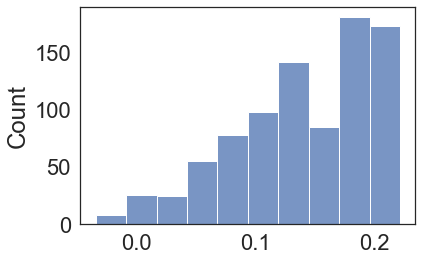

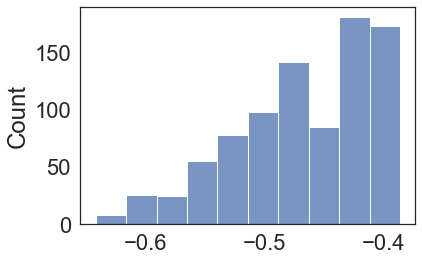

In [23]:
rating = 'ra'
#outlier = 'NOD'
outlier = 'OD'
interpolation = 'LN'


file_label = f'{outlier}_{interpolation}_{rating}'



training_w_sod  =   dir_p /'data'/'dataset'/'Preprocessed'/f'Training_W_{file_label}.csv'
training_afr_sod = dir_p /'data'/'dataset'/'Preprocessed'/f'Training_Afr_{file_label}.csv'
training_afr_50_sod = dir_p /'data'/'dataset'/'Preprocessed'/f'Training_Afr_50_{file_label}.csv'





# Initiate parameter grid

# param distribution
n_estimators      = np.arange(100, 800,50)
max_features = np.arange(1,16) 
#the maximum number of features Random Forest is allowed to try in individual tree

bootstrap    = [True, False] # deafult is false for extra trees True for randomforest
contamination = np.arange(0.0001, 0.12, 0.0001)

# updated param distribution
#n_estimators      = Integer(150, 500)#  BEST 100

max_samples =  np.arange(100, 4000, 5)


random_state = 42

hyperparameters = {}


# Update dict with Extra Trees
hyperparameters.update({"IF": { 
                             'detector__n_estimators': n_estimators,  # # inc up to a point then overfit train reduce test
    
                             'detector__bootstrap': bootstrap,
                             #'detector__ccp_alpha':[ 0.0],
    
                             'detector__contamination': contamination, # inc up to a point then overfit train reduce test
    
                             'detector__max_features': max_features,  # # inc up to a point then overfit train reduce test
                             'detector__max_samples': max_samples, 
                           
                                             }})


hfs = [hf_W_copy_ra_n, hf_Afr_copy_ra_n, hf_Afr_50_copy_ra_n,  ]
regions = ['W', 'Afr', 'Afr_50',]
file_outs = [training_w_sod , training_afr_sod, training_afr_50_sod, ]

for hf, region, file_out in zip(hfs, regions, file_outs):
    
    
    X_train = hf[features_ln]
    y_train = hf[target]

    # Initialize dictionary to store results
    results = {}

    kfold = 5

    cv = KFold(n_splits=kfold, random_state=random_state, shuffle=True)
    n_iter = 10


    # Tune and evaluate detectors
    detector_label = 'IF'

    # Print message to user
    print('#'*60)
    print(f"Now tuning {detector_label} for {region}.")

    def scorer_f(estimator, X):   #your own scorer
          return np.mean(estimator.score_samples(X)) *-1


    #scoring = make_scorer(nrmse , greater_is_better=False )
    #scoring = make_scorer(r2_normalized, greater_is_better=True)
    #scoring = make_scorer(scorer_f, greater_is_better=True)
    scoring = make_scorer(mean_squared_error,squared=False, greater_is_better=False)


    # Scale features via Z-score normalization
    #scaler = StandardScaler()
    #scaler= RobustScaler()

    detector = IsolationForest(random_state=random_state)

    '''# Define steps in pipeline
    steps = [("detector", detector)]

    # Initialize Pipeline object
    pipeline_bscv = Pipeline(steps = steps)'''
    

    scaler = PowerTransformer(method='yeo-johnson',standardize=True)


    numeric_transformer = scaler

    categorical_transformer = OrdinalEncoder(handle_unknown='use_encoded_value' , unknown_value =-1)


    preprocessor = ColumnTransformer(
        transformers=[
       ("num", numeric_transformer, selector(dtype_exclude="category")),
            ("cat", categorical_transformer, selector(dtype_include="category")),
        ]
    )


    # Append classifier to preprocessing pipeline.
    # Now we have a full prediction pipeline.
    steps=[("preprocessor", preprocessor), ("detector", detector)]

    pipeline_bscv = Pipeline(steps = steps)

    #pipeline_bscv = TransformedTargetRegressor(regressor=pipeline, transformer=scaler)



    # Define parameter grid
    search_space = hyperparameters[detector_label]

    # Initialize BaysSearch object                  
    bscv = BayesSearchCV(
        pipeline_bscv,
        # (parameter space, # of evaluations)
        search_space,
        n_iter = n_iter, 
        cv = cv, 
        #verbose = 3, 
        n_jobs= -1, 
        scoring= scorer_f,
        return_train_score=True,
        refit=True,
        random_state=random_state,
    )

    # Fit gscv
    bscv.fit(X_train)  

    # Get best parameters and score
    best_params = bscv.best_params_
    best_score = bscv.best_score_


    print(f'Optimization has terminated for {region}.')
   

    #save results
    bs_if_hyp  =  dir_p/'RF_Hyperparameters'/f'IF_hyper_{region}_{file_label}.csv'

    dropped_columns = ['mean_fit_time', 'std_fit_time',  'params', 'mean_score_time', 'std_score_time']

    # all hyp results
    # gives traing and validation results
    bs_df = pd.DataFrame(bscv.cv_results_)

    bs_df = bs_df.sort_values(f'rank_test_score', ascending=True).reset_index(drop=True)

    bs_df['mean_test_score'] = bs_df['mean_test_score'] 
    bs_df['mean_train_score'] = bs_df['mean_train_score'] 

    split_test = [f'split{x}_test_score' for x in range(kfold)]
    split_train = [f'split{x}_train_score' for x in range(kfold)]

    dropped_columns.extend(split_test)
    dropped_columns.extend(split_train)

    bs_df = bs_df.drop(dropped_columns, axis=1)


    bs_df.to_csv(bs_if_hyp , sep='\t')

    

    #import shap

    sns.set_theme(style="white", font_scale=2)

    def IForest(df, k=1.5):

        idx = copy.deepcopy(features_ghf_ln)

        X = df[features_ln]
        y =  df[target]

        X_if = df[idx]


        IF = IsolationForest(random_state=random_state)
        
        
        ## ranked 1
        
        tuned_param_rank_1 = {item[10:]: best_params[item] for item in best_params}
        IF.set_params(**tuned_param_rank_1 )
        IF.fit(X.values)
        anomaly_decison_rank_1 =  IF.decision_function(X.values)
        anomalies_rank_1  = IF.predict(X.values) 
        scores_rank_1  = IF.score_samples(X.values)
        parameters_rank_1 =IF.get_params()

        # manual and automatic
        tuned_params = {
             'bootstrap': bs_df.loc[0:5, 'param_detector__bootstrap'].mode()[0],
            'contamination': bs_df.loc[0:5, 'param_detector__contamination'].min(),
            'max_features': bs_df.loc[0:5, 'param_detector__max_features'].min(),
            'max_samples': bs_df.loc[0:5, 'param_detector__max_samples'].min(),
            'n_estimators': bs_df.loc[0:5, 'param_detector__n_estimators'].min()
        }
        IF.set_params(**tuned_params)
        IF.fit(X.values)
        anomaly_decison =  IF.decision_function(X.values)
        anomalies = IF.predict(X.values) 
        scores = IF.score_samples(X.values)
        
        #print(IF.get_params())

        mask = anomalies == -1
        X_train_iforest, y_train_iforest = X.values[~mask, :], y.values[~mask]
        #X.values_if.columns = 
        #print(anomalies.shape)



        X_if['scores'] = scores
        X_if['anomaly'] = anomalies

        q1 = X_if['scores'].quantile(0.25)
        q3 = X_if['scores'].quantile(0.75)
        iqr = q3 - q1
        lower_bound=(q1 - k * iqr)
        upper_bound=(q3 + k * iqr)
        
        print('for Automatic optimization')
        print("Lower bound:{} \nUpper bound:{}".format(lower_bound,upper_bound))

        anomolus_dp = X.values[np.where(anomalies == -1, True, False)]
        print("\nThe data has {} anomolus points and the data points are the following for  : ".format(len(anomolus_dp)))
        print("Percentage of anomalies in data: {:.2f}".format((len(anomolus_dp)/len(X.values))*100))
        #print(anomolus_dp)

      
       #####
        hf_tmp = X_if[X_if['anomaly'] ==-1][idx]
        corr_tuned = hf_tmp.corr().abs()
        corr_tuned.sort_values(by = target, ascending=False, inplace=True)

        corr_tuned.drop(target, inplace=True)

        corr_tuned.index.to_list().append(target)

        columns_titles = corr_tuned.index.to_list()
        columns_titles.append(target)

        corr_tuned=corr_tuned.reindex(columns=columns_titles)

        obs_tmp = obs.set_index('OBS_REF_LN')
        y_axis_labels = [obs_tmp.loc[feature, 'LABELS'] for feature in corr_tuned.index]

        x_axis_labels = copy.deepcopy(y_axis_labels)

        x_axis_labels.append('GHF')
        # Increase the size of the heatmap.
        fig = plt.figure(num=None, figsize=(30, 10), dpi=80, facecolor='w', edgecolor='k')
       
        heatmap = sns.heatmap(corr_tuned, vmin=0, vmax=1, annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
        # Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
        heatmap.set_title('Pearson Correlation Heatmap after optimization', fontdict={'fontsize':12}, pad=12);

         ######

        hf_tmp = X_if[idx]
        corr = hf_tmp.corr().abs()
        corr.sort_values(by = target, ascending=False, inplace=True)

        corr.drop(target, inplace=True)

        corr.index.to_list().append(target)

        columns_titles = corr.index.to_list()
        columns_titles.append(target)

        corr=corr.reindex(columns=columns_titles)

        obs_tmp = obs.set_index('OBS_REF_LN')
        y_axis_labels = [obs_tmp.loc[feature, 'LABELS'] for feature in corr.index]

        x_axis_labels = copy.deepcopy(y_axis_labels)

        x_axis_labels.append('GHF')
        # Increase the size of the heatmap.
        fig = plt.figure(num=None, figsize=(30, 10), dpi=80, facecolor='w', edgecolor='k')

        

        heatmap = sns.heatmap(corr, vmin=0, vmax=1, annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
        # Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
        heatmap.set_title('Pearson Correlation Heatmap before optimization', fontdict={'fontsize':12}, pad=12);
        plt.show()
        ######
        
        
        
        print('Without outlier detection')
        print(f'r2 before : {round(corr[target].sum(),3)}, mean : {round(corr[target].sum()/len(X.columns),3)}\n')
        print(f' < 0.1 : {len(corr[corr[target] < 0.15])}')
        print(f' > 0.5 : {len(corr[corr[target] > 0.5])}')
        print('#'*20)
        print('Ranked 1 best paramter and score')
        print(f'score :  {round(np.mean(scores_rank_1),5)*-1}')
        print(f'parameter : {parameters_rank_1}\n')
        print('#'*20)
        print('Automatic tuned paramter and score')
        print(f'r2 : {round(corr_tuned[target].sum(),3)}, mean : {round(corr_tuned[target].sum()/len(X.columns),3)}')
        print(f'score :  {round(np.mean(scores)*-1,5)}')
        print(f' < 0.1 : {len(corr_tuned[corr_tuned[target] < 0.15])}')
        print(f' > 0.5 : {len(corr_tuned[corr_tuned[target] > 0.5])}')
        print(f'parameter : {tuned_params}\n')

        
        #####
        print("\n Offset for Isolation forest")
        print(IF.offset_)

        sns.histplot(anomaly_decison, bins=10)
        plt.show()
        ######
        sns.histplot(np.sort(scores), bins=10)
        plt.show()
        
        bs_if_hyp =  dir_p/'RF_Hyperparameters'/f'IF_{region}_{file_label}.csv'


        bs_if_hyp_df = pd.DataFrame.from_dict([tuned_params])


        bs_if_hyp_df.to_csv(bs_if_hyp , index=False, sep='\t')


        hf_tmp_csv =  df[~mask].sort_values(by=['lon', 'lat'], ascending=True).reset_index(drop=False)
        hf_tmp_csv.to_csv(file_out , index=False, header=True, sep='\t')
        
        
        
        
        return



    IForest(hf, k=2)

    ## save files 




rating best removed N

############################################################
Now tuning IF for W.
Optimization has terminated for W.
for Automatic optimization
Lower bound:-0.5353886783794335 
Upper bound:-0.37819625325414163

The data has 659 anomolus points and the data points are the following for  : 
Percentage of anomalies in data: 5.27


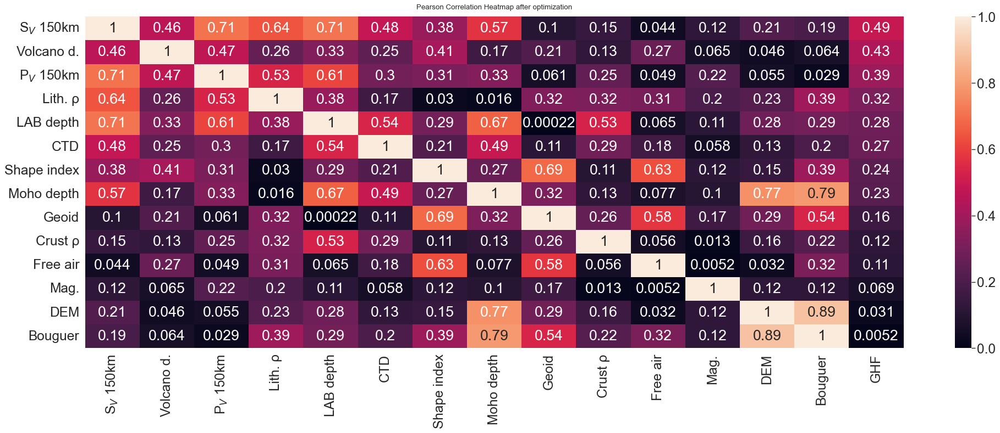

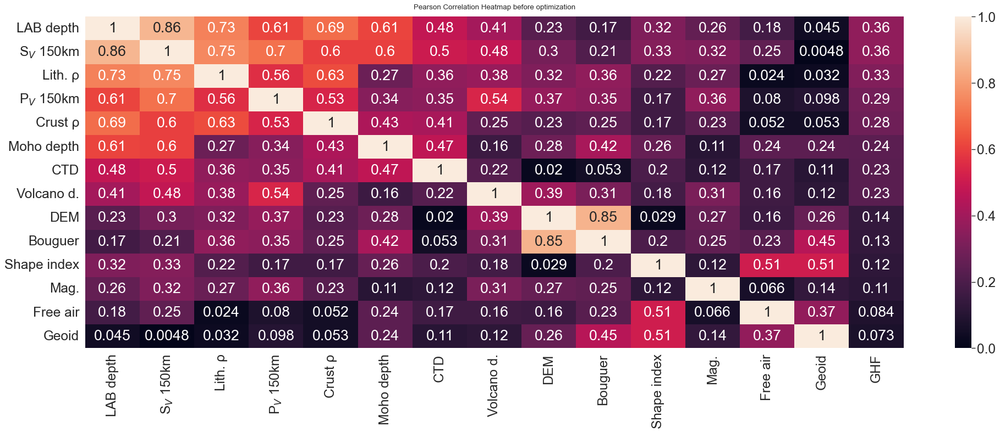

Without outlier detection
r2 before : 2.993, mean : 0.187

 < 0.1 : 6
 > 0.5 : 0
####################
Ranked 1 best paramter and score
score :  0.45406
parameter : {'bootstrap': False, 'contamination': 0.1102, 'max_features': 2, 'max_samples': 1790, 'n_estimators': 200, 'n_jobs': None, 'random_state': 42, 'verbose': 0, 'warm_start': False}

####################
Automatic tuned paramter and score
r2 : 3.159, mean : 0.197
score :  0.45916
 < 0.1 : 5
 > 0.5 : 0
parameter : {'bootstrap': True, 'contamination': 0.05260000000000001, 'max_features': 2, 'max_samples': 835, 'n_estimators': 200}


 Offset for Isolation forest
-0.5038387018833296


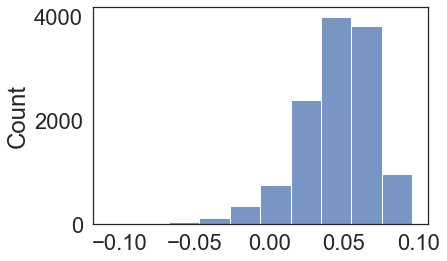

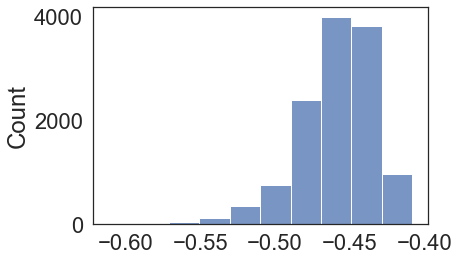

############################################################
Now tuning IF for Afr.
Optimization has terminated for Afr.
for Automatic optimization
Lower bound:-0.6121062253243809 
Upper bound:-0.30402425106761777

The data has 36 anomolus points and the data points are the following for  : 
Percentage of anomalies in data: 2.10


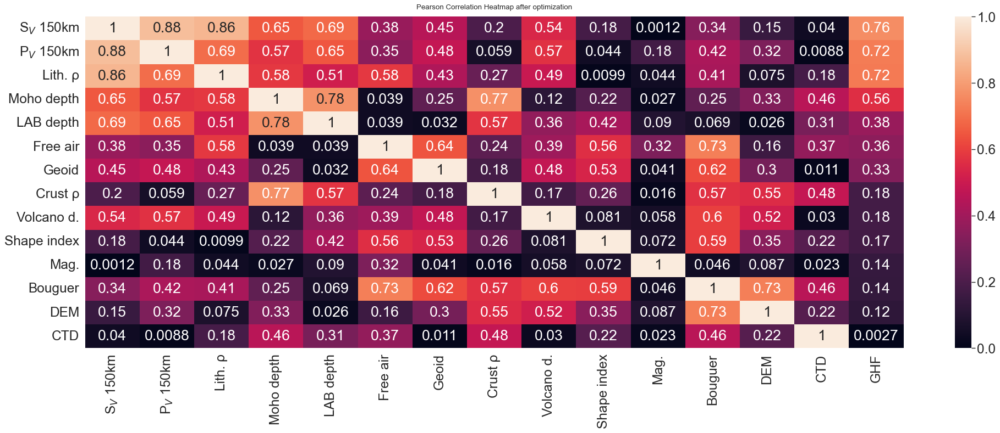

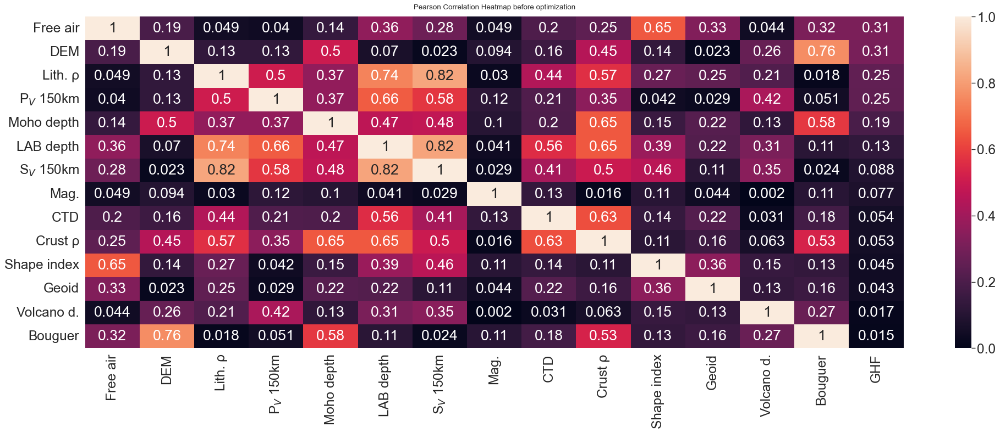

Without outlier detection
r2 before : 1.834, mean : 0.115

 < 0.1 : 9
 > 0.5 : 0
####################
Ranked 1 best paramter and score
score :  0.45991
parameter : {'bootstrap': True, 'contamination': 0.1126, 'max_features': 3, 'max_samples': 835, 'n_estimators': 600, 'n_jobs': None, 'random_state': 42, 'verbose': 0, 'warm_start': False}

####################
Automatic tuned paramter and score
r2 : 4.767, mean : 0.298
score :  0.46139
 < 0.1 : 4
 > 0.5 : 4
parameter : {'bootstrap': True, 'contamination': 0.0207, 'max_features': 3, 'max_samples': 835, 'n_estimators': 350}


 Offset for Isolation forest
-0.5516065937403549


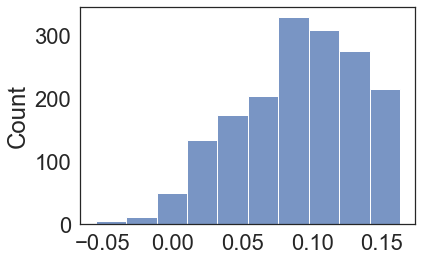

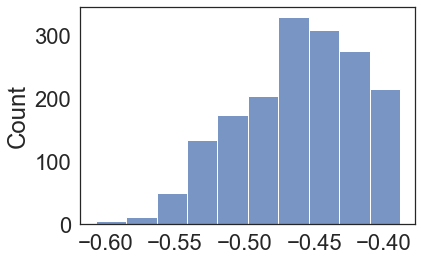

############################################################
Now tuning IF for Afr_50.
Optimization has terminated for Afr_50.
for Automatic optimization
Lower bound:-0.6061844543813485 
Upper bound:-0.3143250551120216

The data has 36 anomolus points and the data points are the following for  : 
Percentage of anomalies in data: 2.10


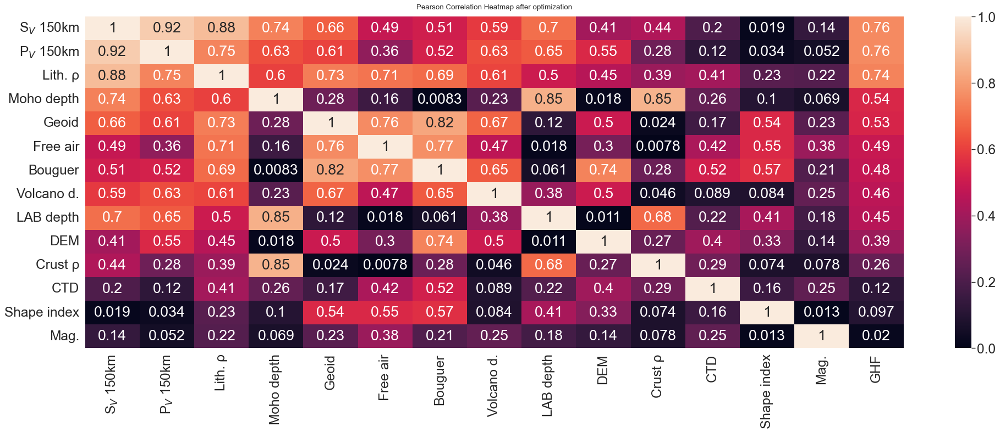

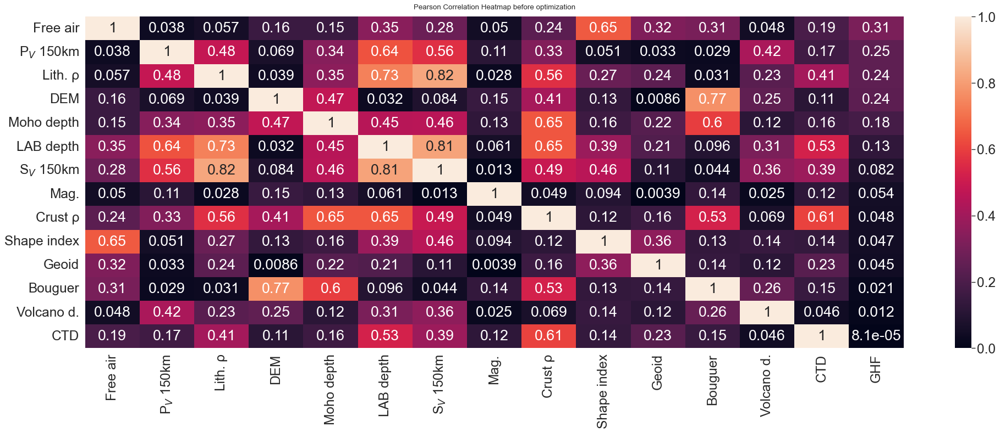

Without outlier detection
r2 before : 1.656, mean : 0.104

 < 0.1 : 9
 > 0.5 : 0
####################
Ranked 1 best paramter and score
score :  0.4614
parameter : {'bootstrap': True, 'contamination': 0.10590000000000001, 'max_features': 5, 'max_samples': 3805, 'n_estimators': 650, 'n_jobs': None, 'random_state': 42, 'verbose': 0, 'warm_start': False}

####################
Automatic tuned paramter and score
r2 : 6.102, mean : 0.381
score :  0.461
 < 0.1 : 3
 > 0.5 : 5
parameter : {'bootstrap': True, 'contamination': 0.0207, 'max_features': 3, 'max_samples': 835, 'n_estimators': 300}


 Offset for Isolation forest
-0.5645810600850245


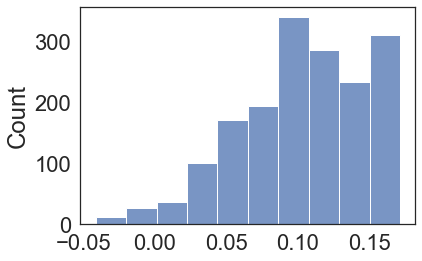

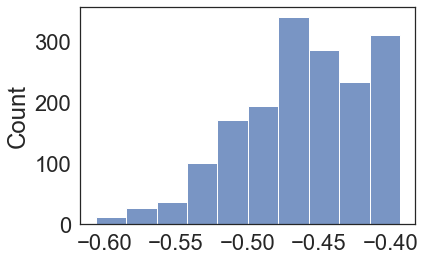

In [24]:

rating = 'rab'
#outlier = 'NOD'
outlier = 'OD'
interpolation = 'LN'


file_label = f'{outlier}_{interpolation}_{rating}'



training_w_sod  =   dir_p /'data'/'dataset'/'Preprocessed'/f'Training_W_{file_label}.csv'
training_afr_sod = dir_p /'data'/'dataset'/'Preprocessed'/f'Training_Afr_{file_label}.csv'
training_afr_50_sod = dir_p /'data'/'dataset'/'Preprocessed'/f'Training_Afr_50_{file_label}.csv'



# Initiate parameter grid

# param distribution
n_estimators      = np.arange(100, 800,50)
max_features = np.arange(1,16) 
#the maximum number of features Random Forest is allowed to try in individual tree

bootstrap    = [True, False] # deafult is false for extra trees True for randomforest
contamination = np.arange(0.0001, 0.12, 0.0001)

# updated param distribution
#n_estimators      = Integer(150, 500)#  BEST 100

max_samples =  np.arange(100, 4000, 5)



hyperparameters = {}


# Update dict with Extra Trees
hyperparameters.update({"IF": { 
                             'detector__n_estimators': n_estimators,  # # inc up to a point then overfit train reduce test
    
                             'detector__bootstrap': bootstrap,
                             #'detector__ccp_alpha':[ 0.0],
    
                             'detector__contamination': contamination, # inc up to a point then overfit train reduce test
    
                             'detector__max_features': max_features,  # # inc up to a point then overfit train reduce test
                             'detector__max_samples': max_samples, 
                           
                                             }})


hfs = [hf_W_copy_rab_n, hf_Afr_copy_rab_n, hf_Afr_50_copy_rab_n,  ]
regions = ['W', 'Afr', 'Afr_50', ]
file_outs = [training_w_sod , training_afr_sod, training_afr_50_sod,]

for hf, region, file_out in zip(hfs, regions, file_outs):
    
    X_train = hf[features_ln]
    y_train = hf[target]

    # Initialize dictionary to store results
    results = {}

    kfold = 5

    cv = KFold(n_splits=kfold, random_state=42, shuffle=True)
    n_iter = 10


    # Tune and evaluate detectors
    detector_label = 'IF'

    # Print message to user
    print('#'*60)
    print(f"Now tuning {detector_label} for {region}.")

    def scorer_f(estimator, X):   #your own scorer
          return np.mean(estimator.score_samples(X)) *-1


    #scoring = make_scorer(nrmse , greater_is_better=False )
    #scoring = make_scorer(r2_normalized, greater_is_better=True)
    scoring = make_scorer(scorer_f, greater_is_better=True)

    # Scale features via Z-score normalization
    #scaler = StandardScaler()
    #scaler= RobustScaler()

    detector = IsolationForest(random_state=42)

    scaler = PowerTransformer(method='yeo-johnson',standardize=True)


    numeric_transformer = scaler

    categorical_transformer = OrdinalEncoder(handle_unknown='use_encoded_value' , unknown_value =-1)


    preprocessor = ColumnTransformer(
        transformers=[
       ("num", numeric_transformer, selector(dtype_exclude="category")),
            ("cat", categorical_transformer, selector(dtype_include="category")),
        ]
    )


    # Append classifier to preprocessing pipeline.
    # Now we have a full prediction pipeline.
    steps=[("preprocessor", preprocessor), ("detector", detector)]

    pipeline_bscv = Pipeline(steps = steps)


    # Define parameter grid
    search_space = hyperparameters[detector_label]

    # Initialize BaysSearch object                  
    bscv = BayesSearchCV(
        pipeline_bscv,
        # (parameter space, # of evaluations)
        search_space,
        n_iter = n_iter, 
        cv = cv, 
        #verbose = 3, 
        n_jobs= -1, 
        scoring= scorer_f,
        return_train_score=True,
        refit=True,
        random_state=42,
    )

    # Fit gscv
    bscv.fit(X_train)  

    # Get best parameters and score
    best_params = bscv.best_params_
    best_score = bscv.best_score_


    print(f'Optimization has terminated for {region}.')
   

    #save results
    bs_if_hyp  =  dir_p/'RF_Hyperparameters'/f'IF_hyper_{region}_{file_label}.csv'

    dropped_columns = ['mean_fit_time', 'std_fit_time',  'params', 'mean_score_time', 'std_score_time']

    # all hyp results
    # gives traing and validation results
    bs_df = pd.DataFrame(bscv.cv_results_)

    bs_df = bs_df.sort_values(f'rank_test_score', ascending=True).reset_index(drop=True)

    bs_df['mean_test_score'] = bs_df['mean_test_score'] 
    bs_df['mean_train_score'] = bs_df['mean_train_score'] 

    split_test = [f'split{x}_test_score' for x in range(kfold)]
    split_train = [f'split{x}_train_score' for x in range(kfold)]

    dropped_columns.extend(split_test)
    dropped_columns.extend(split_train)

    bs_df = bs_df.drop(dropped_columns, axis=1)


    bs_df.to_csv(bs_if_hyp , sep='\t')

    

    #import shap

    sns.set_theme(style="white", font_scale=2)

    def IForest(df, k=1.5):

        idx = copy.deepcopy(features_ghf_ln)

        X = df[features_ln]
        y =  df[target]

        X_if = df[idx]


        IF = IsolationForest(random_state=42)
        
        
        ## ranked 1
        
        tuned_param_rank_1 = {item[10:]: best_params[item] for item in best_params}
        IF.set_params(**tuned_param_rank_1 )
        IF.fit(X.values)
        anomaly_decison_rank_1 =  IF.decision_function(X.values)
        anomalies_rank_1  = IF.predict(X.values) 
        scores_rank_1  = IF.score_samples(X.values)
        parameters_rank_1 =IF.get_params()

        # manual and automatic
        tuned_params = {
             'bootstrap': bs_df.loc[0:5, 'param_detector__bootstrap'].mode()[0],
            'contamination': bs_df.loc[0:5, 'param_detector__contamination'].min(),
            'max_features': bs_df.loc[0:5, 'param_detector__max_features'].min(),
            'max_samples': bs_df.loc[0:5, 'param_detector__max_samples'].min(),
            'n_estimators': bs_df.loc[0:5, 'param_detector__n_estimators'].min()
        }
        IF.set_params(**tuned_params)
        IF.fit(X.values)
        anomaly_decison =  IF.decision_function(X.values)
        anomalies = IF.predict(X.values) 
        scores = IF.score_samples(X.values)
        
        #print(IF.get_params())

        mask = anomalies == -1
        X_train_iforest, y_train_iforest = X.values[~mask, :], y.values[~mask]
        #X.values_if.columns = 
        #print(anomalies.shape)



        X_if['scores'] = scores
        X_if['anomaly'] = anomalies

        q1 = X_if['scores'].quantile(0.25)
        q3 = X_if['scores'].quantile(0.75)
        iqr = q3 - q1
        lower_bound=(q1 - k * iqr)
        upper_bound=(q3 + k * iqr)
        
        print('for Automatic optimization')
        print("Lower bound:{} \nUpper bound:{}".format(lower_bound,upper_bound))

        anomolus_dp = X.values[np.where(anomalies == -1, True, False)]
        print("\nThe data has {} anomolus points and the data points are the following for  : ".format(len(anomolus_dp)))
        print("Percentage of anomalies in data: {:.2f}".format((len(anomolus_dp)/len(X.values))*100))
        #print(anomolus_dp)

      
       #####
        hf_tmp = X_if[X_if['anomaly'] ==-1][idx]
        corr_tuned = hf_tmp.corr().abs()
        corr_tuned.sort_values(by = target, ascending=False, inplace=True)

        corr_tuned.drop(target, inplace=True)

        corr_tuned.index.to_list().append(target)

        columns_titles = corr_tuned.index.to_list()
        columns_titles.append(target)

        corr_tuned=corr_tuned.reindex(columns=columns_titles)

        obs_tmp = obs.set_index('OBS_REF_LN')
        y_axis_labels = [obs_tmp.loc[feature, 'LABELS'] for feature in corr_tuned.index]

        x_axis_labels = copy.deepcopy(y_axis_labels)

        x_axis_labels.append('GHF')
        # Increase the size of the heatmap.
        fig = plt.figure(num=None, figsize=(30, 10), dpi=80, facecolor='w', edgecolor='k')
       
        heatmap = sns.heatmap(corr_tuned, vmin=0, vmax=1, annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
        # Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
        heatmap.set_title('Pearson Correlation Heatmap after optimization', fontdict={'fontsize':12}, pad=12);

         ######

        hf_tmp = X_if[idx]
        corr = hf_tmp.corr().abs()
        corr.sort_values(by = target, ascending=False, inplace=True)

        corr.drop(target, inplace=True)

        corr.index.to_list().append(target)

        columns_titles = corr.index.to_list()
        columns_titles.append(target)

        corr=corr.reindex(columns=columns_titles)

        obs_tmp = obs.set_index('OBS_REF_LN')
        y_axis_labels = [obs_tmp.loc[feature, 'LABELS'] for feature in corr.index]

        x_axis_labels = copy.deepcopy(y_axis_labels)

        x_axis_labels.append('GHF')
        # Increase the size of the heatmap.
        fig = plt.figure(num=None, figsize=(30, 10), dpi=80, facecolor='w', edgecolor='k')

        

        heatmap = sns.heatmap(corr, vmin=0, vmax=1, annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)
        # Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
        heatmap.set_title('Pearson Correlation Heatmap before optimization', fontdict={'fontsize':12}, pad=12);
        plt.show()
        ######
        
        print('Without outlier detection')
        print(f'r2 before : {round(corr[target].sum(),3)}, mean : {round(corr[target].sum()/len(X.columns),3)}\n')
        print(f' < 0.1 : {len(corr[corr[target] < 0.15])}')
        print(f' > 0.5 : {len(corr[corr[target] > 0.5])}')
        print('#'*20)
        print('Ranked 1 best paramter and score')
        print(f'score :  {round(np.mean(scores_rank_1),5)*-1}')
        print(f'parameter : {parameters_rank_1}\n')
        print('#'*20)
        print('Automatic tuned paramter and score')
        print(f'r2 : {round(corr_tuned[target].sum(),3)}, mean : {round(corr_tuned[target].sum()/len(X.columns),3)}')
        print(f'score :  {round(np.mean(scores)*-1,5)}')
        print(f' < 0.1 : {len(corr_tuned[corr_tuned[target] < 0.15])}')
        print(f' > 0.5 : {len(corr_tuned[corr_tuned[target] > 0.5])}')
        print(f'parameter : {tuned_params}\n')

        
        #####
        print("\n Offset for Isolation forest")
        print(IF.offset_)

        sns.histplot(anomaly_decison, bins=10)
        plt.show()
        ######
        sns.histplot(np.sort(scores), bins=10)
        plt.show()
        
        bs_if_hyp =  dir_p/'RF_Hyperparameters'/f'IF_{region}_{file_label}.csv'


        bs_if_hyp_df = pd.DataFrame.from_dict([tuned_params])


        bs_if_hyp_df.to_csv(bs_if_hyp , index=False, sep='\t')
        
        hf_tmp_csv =  df[~mask].sort_values(by=['lon', 'lat'], ascending=True).reset_index(drop=False)
        hf_tmp_csv.to_csv(file_out , index=False, header=True, sep='\t')


        return 



    IForest(hf, k=2)


